# **Automatic Detection of Volcanic Scoria Cones from Digital Elevation Models**

**Course:** Computational Vision  
**Student:** Francesco Frattini - 5721355

---

## Introduction

Scoria cones are among the most common volcanic landforms on Earth. They form from explosive eruptions that launch magma into the air; the solidified material (lapilli and scoria) accumulates around the vent, building a nearly
perfect cone with a central crater.

Mapping these structures is important both for geological research and volcanic risk management. However, manual mapping over large areas is time-consuming and expensive, and results are often heterogeneous in quality and criteria across different surveys and research groups.

This project investigates the problem of **automatic scoria cone detection from Digital Elevation Models (DEMs)** through a progressive, two-stage methodology that mirrors the natural scientific process of hypothesis, failure, and refinement.

**Stage 1 - Knowledge-Driven Feature Engineering**
The first stage encodes established geological knowledge about scoria cones directly into computational filters. Scoria cone flanks are characterised by consistent slope angles (25°-35°), smooth surfaces relative to surrounding terrain, and circular plan-view geometry. These properties are extracted as morphometric maps from the DEM and combined into binary spatial
masks identifying candidate pixels.

**Stage 2 - Data-Driven Refinement via Machine Learning**
The rule-based approach, while physically motivated, proves insufficient on its own: the morphological complexity of real volcanic islands generates a large number of false positives that cannot be eliminated by threshold-based filters alone. The second stage therefore reframes the problem as a
supervised binary classification task. A permissive blob detector (Laplacian of Gaussian) first extracts thousands of candidate circular structures from the texture shading rendering. Each candidate is then described by a feature
vector of zonal statistics computed from the morphometric maps of Stage 1. A Random Forest classifier, trained on the ground-truth annotations of El Hierro, learns to distinguish true cone signatures from false positives.

This hybrid pipeline - physical knowledge for feature engineering, machine learning for discrimination - produces a detector that is both interpretable and quantitatively evaluated.

---

## Datasets

| Dataset | Resolution | DEM | Renderings | Annotations |
|---|---|---|---|---|
| El Hierro (Canary Islands) | 5 m/px | ✅ | ✅ NE, NW, Texture | ✅ 196 annotated cones |
| Jeju (South Korea) | 10 m/px | ✅ | ✅ NE, NW, Texture | ❌ |

**El Hierro** is the primary development and validation dataset. It provides 196 geologically annotated scoria cones (crater centroids and base perimeters from expert shapefile mapping), enabling quantitative evaluation via precision, recall, and F1 score. Its complex, heavily eroded morphology makes it a challenging benchmark that motivates the
transition from rule-based to data-driven detection.

**Jeju** is the blind generalisation test. With no ground truth
available, results are assessed qualitatively: do the detected candidates correspond to visually plausible volcanic structures? Does the model trained on El Hierro, a steep, erosionally complex oceanic island, generalise to Jeju, a low-relief basaltic shield with morphologically isolated cones on a flat background? This cross-domain transfer test
is the final and most scientifically interesting evaluation of the pipeline.

**Etna** (Sicily, 2 m/px) is available, but won't be used inside this project. Its shapefile annotations contain documented false positives and false negatives, making it unreliable as ground truth for either training or evaluation.

---

## Pipeline Overview

The pipeline is organised in four modules:

**Module 1 - DEM Preprocessing**
Load the DEM, handle NoData values, and compute three derived
morphometric maps: slope (steepness in degrees), aspect (slope
orientation), and roughness (local surface irregularity). These maps constitute the physical feature space of the project.

**Module 2 - Multi-Channel Visualisation**
Combine the three provided renderings (NE shading, NW shading, Texture shading) into a 3-channel composite image. This serves as the primary visual reference throughout the project.

**Module 3 - Knowledge-Driven Morphometric Filter**
Intersect a slope mask (25°-35°) with a smoothness mask to isolate pixels physically consistent with scoria cone flanks. The resulting binary mask is deliberately inclusive: it is used as a spatial validator in Module 4, not as a standalone detector. Its limitations on complex terrain motivate the data-driven refinement step.

**Module 4 - Candidate Detection and ML-Based Classification**
Apply a permissive LoG blob detector to extract thousands of circular candidates from the texture shading. Compute zonal statistics for each candidate from the morphometric maps. Label candidates against the El Hierro ground truth and train a Random Forest classifier to separate true cones from false positives. Evaluate quantitatively on El Hierro and apply the trained model to Jeju for qualitative generalisation analysis.

---


## Module 1 - DEM Preprocessing

The raw **DEM** is a single-channel raster where each pixel encodes an absolute elevation value in meters. \
Before any analysis, we need to:
- Load the file and inspect its metadata (resolution, coordinate reference system, value range);
- Handle NoData values (pixels outside the island boundary);
- Compute three derived morphometric maps from the elevation data:
  - **Slope** - the steepness of each pixel in degrees
  - **Aspect** - the compass direction each pixel faces
  - **Roughness** - the local surface irregularity around each pixel

These maps encode the physical properties we will use as filters in Module 3.

### 1.1 - Imports and paths

Standard scientific stack plus `rasterio` for georeferenced raster I/O. \
Google Drive is mounted and a base directory is set so all subsequent paths
are relative and portable across Colab sessions.

In [1]:
import os
import numpy as np
import rasterio
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import sobel, uniform_filter
from skimage.feature import blob_log

from google.colab import drive
drive.mount('/content/drive')

BASE_DIR = "/content/drive/MyDrive/Frattini_ScoriaConesProject"
os.chdir(BASE_DIR)

# Relative Path
HIERRO_DEM_PATH = "Hierro/Hierro.tif"
JEJU_DEM_PATH   = "Jeju/Jeju.tif"

Mounted at /content/drive


### 1.2 - DEM loading

`load_dem` opens the GeoTIFF with `rasterio`, reads the single elevation band as a float32 array, and replaces any NoData values (pixels outside the island boundary, or missing data sentinel values) with `NaN`. Keeping NoData as `NaN`
rather than zero or a large negative number ensures that all subsequent computations ignore these pixels naturally without special-casing.

The function also prints a compact metadata summary so we can immediately verify that the file loaded correctly: shape, resolution, CRS, elevation range, and the fraction of NoData pixels.

In [2]:
def load_dem(path):
    """
    Load a georeferenced DEM and return elevation array plus metadata.
    NoData values are replaced with NaN.
    """
    with rasterio.open(path) as src:
        dem        = src.read(1).astype(np.float32)
        transform  = src.transform
        crs        = src.crs
        res        = src.res
        nodata     = src.nodata

    if nodata is not None:
        dem[dem == nodata] = np.nan

    dem[dem < -1000] = np.nan

    print(f"Loaded:     {path}")
    print(f"Shape:      {dem.shape}  (rows x cols)")
    print(f"Resolution: {res[0]:.1f} m/px")
    print(f"CRS:        {crs}")
    print(f"Elevation:  min={np.nanmin(dem):.1f} m  "
          f"max={np.nanmax(dem):.1f} m  "
          f"mean={np.nanmean(dem):.1f} m")
    print(f"NoData px:  {np.isnan(dem).sum():,} "
          f"({100*np.isnan(dem).mean():.1f}%)")

    return dem, transform, crs, res

### 1.3 - Morphometric Maps

Three maps are derived from the raw elevation array to capture the geometry of volcanic landforms.

#### Slope
**Slope** measures the maximum rate of change in elevation for each pixel, expressed in degrees. It is computed by extracting the horizontal ($dx$) and vertical ($dy$) terrain gradients using the **Sobel operator**.

The Sobel kernel applies a directional smoothing that reduces high-frequency noise in the DEM. Because the raw convolution outputs are scaled by the kernel size, they are normalized by $8 \times \text{res}$ (where $\text{res}$ is the spatial resolution in metres) to convert pixel units into a true rise-over-run ratio ($m/m$):

$$dx = \frac{\text{Sobel}_x(\text{DEM})}{8 \cdot \text{res}_x}, \quad dy = \frac{\text{Sobel}_y(\text{DEM})}{8 \cdot \text{res}_y}$$

The magnitude of the gradient is then converted to degrees:

$$\theta_{\text{slope}} = \arctan\left(\sqrt{dx^2 + dy^2}\right) \cdot \frac{180}{\pi}$$

**Geomorphological Relevance:** This is the primary morphometric criterion for identification. Fresh scoria cones are constructional landforms governed by the angle of repose of loose pyroclastic material (lapilli and scoria). Literature demonstrates that their flanks consistently exhibit stable slopes ranging between **25° and 35°**.

---

##### Deep Dive - How the Sobel operator works

The Sobel operator is a $3 \times 3$ convolution kernel that slides over the elevation grid. To estimate the east–west gradient $dx$, it applies the following kernel:

$$K_x = \begin{pmatrix} -1 & 0 & +1 \\ -2 & 0 & +2 \\ -1 & 0 & +1 \end{pmatrix}$$

At each pixel, the kernel multiplies the neighbours to the right by positive weights and those to the left by negative weights, then sums everything. The result is the net elevation difference in the horizontal direction, effectively a numerical derivative. The central row carries double weight ($\pm 2$) compared to the corner rows ($\pm 1$): this is a deliberate smoothing along the perpendicular direction that suppresses high-frequency noise in the DEM without blurring the gradient estimate itself.

**Why divide by 8?**
The directional operator calculates the elevation difference across opposite columns, which are separated by a distance of two pixels ($2 \times \text{res}$). Simultaneously, to reduce noise, Scipy's internal implementation applies a perpendicular smoothing with a total weight configuration of 4 ($4\times$). Combining this internal vertical scaling ($4\times$) with the horizontal pixel distance factor ($2\times$) amplifies the raw output by a factor of 8 ($4 \times 2 = 8$). Dividing by $8 \times \text{res}$ completely undoes this scaling and recovers the actual rise-over-run ratio ($m/m$).

**Why divide by `res`?**
A pixel is not an abstract unit; it represents a real physical distance on the ground. At 5 m/px resolution, moving one pixel to the right means moving 5 metres in reality. Dividing by `res` converts the gradient from *metres of elevation change per pixel* to *metres of elevation change per metre of horizontal distance*.

**From gradient to degrees:**
Once $dx$ and $dy$ are available, the total slope magnitude is obtained via the Pythagorean theorem:

$$\sqrt{dx^2 + dy^2}$$

This combines the east-west and north-south components into the steepest-descent gradient magnitude. Applying $\arctan$ converts the dimensionless rise-over-run ratio into an angle in radians, and `np.degrees` converts to the sexagesimal degrees used in the geomorphological literature.

**Physical interpretation of the 25°-35° range:**
When magma fragments in the air and falls back as loose scoria and lapilli, it behaves mechanically like granular material. Gravity and inter-particle friction reach an equilibrium at the *angle of repose*, the steepest angle at which the material remains stable without sliding. For fresh pyroclastic scoria this angle is remarkably consistent worldwide and falls precisely in the 25°-35° window. Slopes below ~20° are typically flat plains or cone bases; slopes above ~40° are more consistent with bedrock cliffs or DEM artefacts, since loose scoria cannot physically remain stable at those angles.

---

#### Aspect
**Aspect** defines the downslope direction of the terrain, measured in degrees clockwise from North (0° to 360°). It is mathematically derived from the same gradient components via the two-argument arctangent function to resolve the correct quadrant:

$$\alpha_{\text{aspect}} = \operatorname{arctan2}(-dy,\; dx) \pmod{360}$$

**Geomorphological Relevance:** While aspect is isotropic for a perfectly symmetrical cone (covering all 360° evenly), it becomes a powerful descriptor for analyzing **structural asymmetries**. It helps identify breaches in crater rims (often caused by lava effusions breaking the cone base) or dominant paleowind directions that caused asymmetric tephra deposition during the eruptive phase.

---

##### Deep Dive - Why `arctan2` and the sign conventions

**Why not simply `arctan(dy/dx)`?**
A standard $\arctan$ takes a single ratio and cannot distinguish opposite directions. For example, a slope rising toward the north-east and one falling toward the south-west would produce the same $dy/dx$ value, yet their aspects differ by 180°. `arctan2(-dy, dx)` receives both components separately, preserving their individual signs, and therefore unambiguously identifies the correct quadrant among all four cardinal directions.

**Why the minus sign in front of `dy`?**
In digital raster files, the origin $(0, 0)$ is at the top-left corner, and row indices increase downward. This is the opposite of the standard Cartesian convention where $+y$ points upward. Without correction, North and South would be swapped in the aspect map. Negating $dy$ flips the vertical axis back to geographic convention, so that $0°$ correctly points North (up in the image) and $180°$ points South (down).

**Why `% 360`?**
`arctan2` returns values in the range $[-180°, +180°]$. The modulo operation maps negative angles into their positive equivalents on the compass: for example, a negative angle resulting from the quadrant positioning is mapped back into a positive $[0^\circ, 360^\circ]$ window, ensuring a continuous circular scale consistent with standard geographic convention.

**Reading the aspect map on a cone:**
A perfectly symmetric cone viewed from above produces a circular pattern in which every compass direction appears as a radial wedge of uniform size. Asymmetries are immediately legible: a missing wedge indicates a breached or collapsed flank (a common morphology when lava pressure destroys part of the cone wall), while an elongated deposit in one direction records the prevailing wind during the eruption that asymmetrically transported tephra downwind.

---

#### Roughness
**Roughness** quantifies the local surface irregularity, defined here as the local standard deviation of elevation within a sliding $5 \times 5$ pixel neighborhood.

To process large rasters efficiently, a vectorized approach avoids the heavy computational overhead of standard sliding window loops. Exploiting the algebraic identity $\operatorname{Var}(X) = E[X^2] - (E[X])^2$, the workflow applies a fast moving-average box filter (`uniform_filter`) to compute the local mean and the local mean of squares simultaneously:

$$\sigma = \sqrt{\max\left(0,\; \text{BoxFilter}(\text{DEM}^2) - \left[\text{BoxFilter}(\text{DEM})\right]^2\right)}$$

**Geomorphological Relevance:** Monogenetic scoria cones, particularly in the earlier stages of their post-eruptive degradation, present highly homogeneous, smooth flanks. Conversely, surrounding environments often consist of aa-type lava flows, complex historical stratification, or drainage networks characterized by high structural roughness. Low local standard deviation acts as a key spatial discriminator to isolate the smooth, conical surfaces from highly irregular volcanic backdrops.

---

##### Deep Dive - Variance identity and implementation

**Why not `generic_filter(np.std)`?**
The conceptually straightforward implementation would slide a $5 \times 5$ window over every pixel and call `np.std` on the 25 values inside. On a raster with millions of pixels this requires millions of Python function calls, making it computationally prohibitive for the DEM sizes in this project.

**The variance identity:**
The key insight is the algebraic identity:

$$\operatorname{Var}(X) = E[X^2] - \bigl(E[X]\bigr)^2$$

This means variance can be computed from just two quantities: the local mean of the elevations, and the local mean of the squared elevations. Both are box-filter (moving average) operations, and `scipy.ndimage.uniform_filter` implements these in optimized C code as a single pass over the array, orders of magnitude faster.

**Step by step:**

1. `mean_local = uniform_filter(dem, size=5)` - computes $E[X]$: the average elevation in each $5 \times 5$ neighbourhood.
2. `mean_sq_local = uniform_filter(dem**2, size=5)` - computes $E[X^2]$: the average of squared elevations in the same neighbourhood.
3. `variance = mean_sq_local - mean_local**2` - applies the identity to obtain the local variance at every pixel simultaneously, with no loops.
4. `np.clip(..., 0, None)` - floating-point subtraction can produce infinitesimal negative values (e.g. $-10^{-6}$) due to rounding. Clipping to zero prevents `np.sqrt` from receiving negative inputs and raising errors.
5. `np.sqrt(variance)` - converts variance (units: $\text{m}^2$) back to standard deviation (units: $\text{m}$), giving roughness a physically interpretable scale: the typical elevation spread in metres within a $5 \times 5$ pixel patch.

**The alliance between Slope and Roughness:**
Slope alone is insufficient as a discriminator. Cliff faces, canyon walls, and rocky escarpments can all exhibit slopes in the 25°-35° range. Roughness resolves this ambiguity: a canyon wall is geometrically rough (irregular rock faces, ledges, erosion channels), whereas a scoria cone flank is smooth (uniform pyroclastic deposition). A pixel that is simultaneously steep *and* smooth satisfies both the mechanical constraint of the angle of repose and the depositional homogeneity of constructional volcanism: a combination that effectively isolates cone flanks and eliminates the majority of false positives.

In [3]:
def compute_slope(dem, res):
    """
    Compute slope in degrees using the Sobel gradient operator.
    """
    # Sobel returns gradient in pixel units - divide by pixel size to get m/m
    dx = sobel(np.nan_to_num(dem), axis=1) / (8 * res[0])
    dy = sobel(np.nan_to_num(dem), axis=0) / (8 * res[1])

    slope = np.degrees(np.arctan(np.sqrt(dx**2 + dy**2)))

    # restore NaN mask from original DEM
    slope[np.isnan(dem)] = np.nan
    return slope


def compute_aspect(dem, res):
    """
    Compute aspect (slope orientation) in degrees clockwise from North.
    """
    dx = sobel(np.nan_to_num(dem), axis=1) / (8 * res[0])
    dy = sobel(np.nan_to_num(dem), axis=0) / (8 * res[1])

    aspect = np.degrees(np.arctan2(-dy, dx)) % 360

    aspect[np.isnan(dem)] = np.nan
    return aspect


def compute_roughness(dem, window=5):
    """
    Roughness as local standard deviation of elevation.
    Uses uniform_filter for efficiency: Var(X) = E[X^2] - E[X]^2.
    """
    dem_filled    = np.nan_to_num(dem)

    mean_local    = uniform_filter(dem_filled,    size=window)
    mean_sq_local = uniform_filter(dem_filled**2, size=window)

    variance      = np.clip(mean_sq_local - mean_local**2, 0, None)

    roughness     = np.sqrt(variance).astype(np.float32)
    roughness[np.isnan(dem)] = np.nan
    return roughness

### 1.4 - Visualisation

Two visualisations are produced for each dataset.

The **four-panel overview** shows the raw DEM and the three derived maps side by side. This gives an immediate qualitative sense of the terrain and lets us verify that the computed maps look geologically sensible before proceeding to any analysis.

The **slope histogram** shows the distribution of slope values across all
valid pixels, with the 25°-35° cone range highlighted in red. The fraction of pixels in this range is printed as a quick sanity check: on a volcanic island like El Hierro it should be non-trivial.

In [4]:
def plot_dem_overview(dem, slope, aspect, roughness, title_prefix=""):
    """
    Four-panel overview of the DEM and its derived maps.
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f"{title_prefix} - DEM & Derived Morphometric Maps",
                 fontsize=14, fontweight="bold")

    # 1. Raw DEM
    ax = axes[0, 0]
    im = ax.imshow(dem, cmap="terrain")
    plt.colorbar(im, ax=ax, label="Elevation (m)", fraction=0.03)
    ax.set_title("Raw DEM")
    ax.axis("off")

    # 2. Slope
    ax = axes[0, 1]
    im = ax.imshow(slope, cmap="hot_r", vmin=0, vmax=50)
    plt.colorbar(im, ax=ax, label="Slope (degrees)", fraction=0.03)
    ax.set_title("Slope Map")
    ax.axis("off")

    # 3. Aspect
    ax = axes[1, 0]
    im = ax.imshow(aspect, cmap="hsv")
    plt.colorbar(im, ax=ax, label="Aspect (degrees)", fraction=0.03)
    ax.set_title("Aspect Map")
    ax.axis("off")

    # 4. Roughness
    ax = axes[1, 1]
    im = ax.imshow(roughness, cmap="magma",
                   vmin=np.nanpercentile(roughness, 2),
                   vmax=np.nanpercentile(roughness, 98))
    plt.colorbar(im, ax=ax, label="Roughness (std elevation)", fraction=0.03)
    ax.set_title(f"Roughness Map (window={5}px)")
    ax.axis("off")

    plt.tight_layout()
    plt.show()


def plot_slope_histogram(slope, title_prefix=""):
    """
    Histogram of slope values with the cone target range highlighted.
    """
    fig, ax = plt.subplots(figsize=(8, 4))

    valid = slope[~np.isnan(slope)].ravel()
    ax.hist(valid, bins=100, color="steelblue", alpha=0.7, edgecolor="none")

    # Highlight the 25-35 degree range from the literature
    ax.axvspan(25, 35, color="red", alpha=0.25, label="Cone slope range (25°–35°)")

    ax.set_xlabel("Slope (degrees)")
    ax.set_ylabel("Pixel count")
    ax.set_title(f"{title_prefix} - Slope Distribution")
    ax.legend()
    plt.tight_layout()
    plt.show()

    in_range = np.sum((valid >= 25) & (valid <= 35))
    print(f"Pixels with slope 25–35°: {in_range:,} "
          f"({100 * in_range / len(valid):.2f}% of valid pixels)")

### 1.5 - Run on El Hierro

El Hierro is our development and validation dataset. We load, process, and visualise it first. The results here will guide all parameter choices in the subsequent modules.

Loaded:     Hierro/Hierro.tif
Shape:      (5081, 5681)  (rows x cols)
Resolution: 5.0 m/px
CRS:        EPSG:32628
Elevation:  min=-0.0 m  max=1499.8 m  mean=363.1 m
NoData px:  11,541,374 (40.0%)


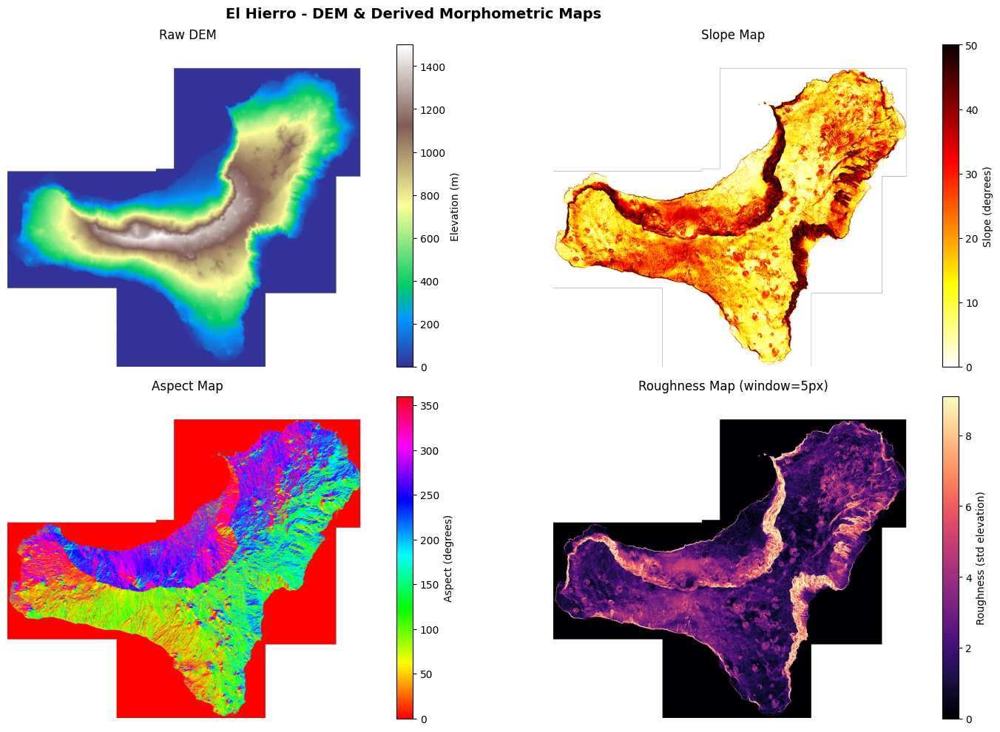

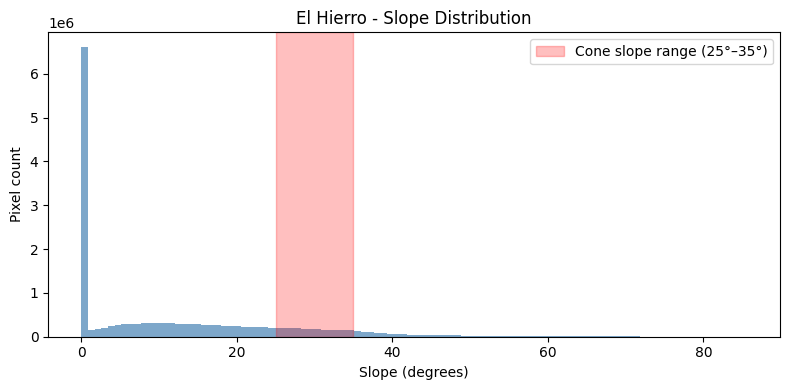

Pixels with slope 25–35°: 2,010,605 (11.61% of valid pixels)


In [5]:
# Run on El Hierro
dem_h, transform_h, crs_h, res_h = load_dem(HIERRO_DEM_PATH)

slope_h     = compute_slope(dem_h, res_h)
aspect_h    = compute_aspect(dem_h, res_h)
roughness_h = compute_roughness(dem_h, window=5)

plot_dem_overview(dem_h, slope_h, aspect_h, roughness_h,
                  title_prefix="El Hierro")
plot_slope_histogram(slope_h, title_prefix="El Hierro")

#### Results: El Hierro

```
Loaded:     Hierro/Hierro.tif
Shape:      (5081, 5681)  (rows x cols)
Resolution: 5.0 m/px
CRS:        EPSG:32628
Elevation:  min=-0.0 m  max=1499.8 m  mean=363.1 m
NoData px:  11,541,374 (40.0%)
Pixels with slope 25-35°: 2,010,605 (11.61% of valid pixels)
```

**Raw DEM.**
The characteristic three-armed shape of El Hierro is immediately recognisable: a young oceanic volcanic island with three ridges radiating from a central
highlands. The elevation gradient runs correctly from blue at sea level (0 m) to grey-white at the summit (~1500 m). The 40% NoData fraction corresponds to the ocean pixels outside the island boundary, which were correctly masked
to NaN during loading.

**Slope Map.**
The island coastline is almost entirely dark red (>40°), consistent with the
steep marine erosion scarps typical of young oceanic islands. The interior shows a heterogeneous mix of yellow-orange (10-25°) across the lower flanks
and plateaus, with darker patches on the steepest ridge flanks. Small circular ring-shaped patterns of higher slope are already discernible across the
interior: these are the scoria cone flanks, exhibiting the elevated slope signal on their sides that we will exploit in Module 3.

**Aspect Map.**
The rapid colour variation across the ridges correctly reflects the complex,
multi-directional slope orientations of a dissected volcanic island. The flat
red areas at the image border correspond to NoData pixels set to zero by
`nan_to_num` before gradient computation; the NaN mask is correctly restored
afterwards so these pixels play no role in subsequent analysis.

**Roughness Map.**
The central ridge crests appear bright (high roughness), consistent with
exposed, fractured bedrock and complex erosional topography. The lower flanks and volcanic plateaus are predominantly dark purple (low roughness), indicating
relatively homogeneous surfaces: a promising signal for the cone filter, since smooth terrain at cone-compatible slopes will be the target of Module 3.

**Slope Distribution.**
The histogram shows the expected right-skewed distribution: a dominant peak
near 0°-5° for flat coastal and plateau areas, a broad shoulder through
moderate slopes, and a tail extending to ~50° for the coastal cliffs.
The **11.61%** of valid pixels falling in the 25°-35° cone range is
geomorphologically coherent for a densely volcanic island like El Hierro.
The distribution does not drop abruptly at 25°: there is a visible
concentration of pixels in the target window, confirming that the 25°-35°
threshold captures a real morphological population and not merely the tail of a smooth continuous distribution.

### 1.6 - Run on Jeju

Jeju is our blind test dataset (no annotations available). The same functions are applied without any changes (except when explicitly indicated
). We do not use the Jeju results to tune any parameter; it will only be used for qualitative analysis in the last Module.

Loaded:     Jeju/Jeju.tif
Shape:      (4364, 7761)  (rows x cols)
Resolution: 10.0 m/px
CRS:        EPSG:32652
Elevation:  min=0.0 m  max=1945.0 m  mean=211.4 m
NoData px:  9,121,083 (26.9%)


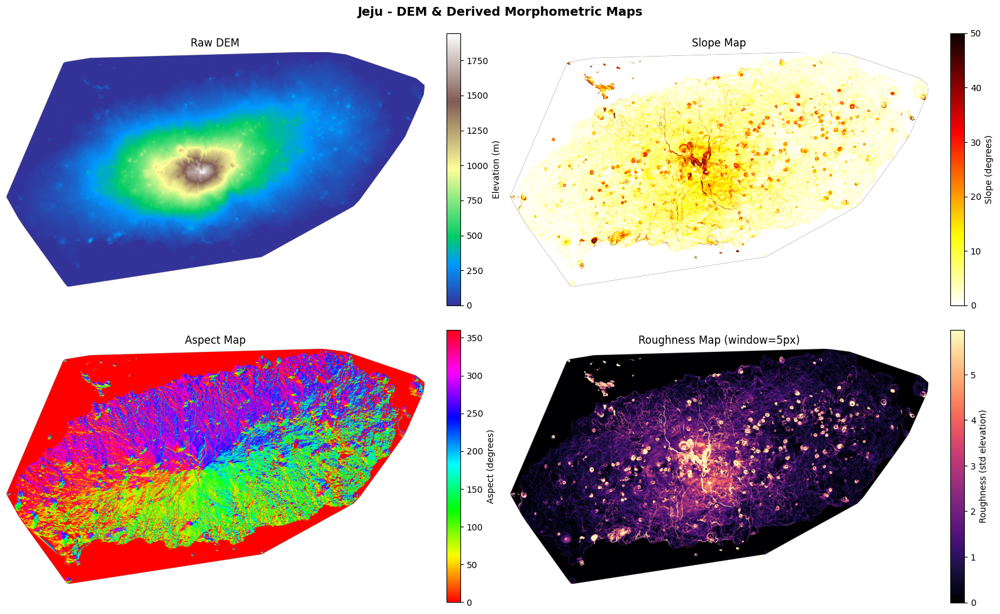

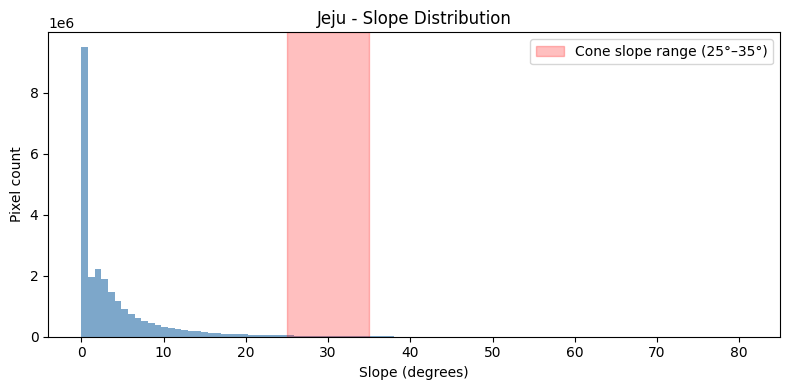

Pixels with slope 25–35°: 304,937 (1.23% of valid pixels)


In [6]:
# Run on Jeju
dem_j, transform_j, crs_j, res_j = load_dem(JEJU_DEM_PATH)

slope_j     = compute_slope(dem_j, res_j)
aspect_j    = compute_aspect(dem_j, res_j)
roughness_j = compute_roughness(dem_j, window=5)

plot_dem_overview(dem_j, slope_j, aspect_j, roughness_j,
                  title_prefix="Jeju")
plot_slope_histogram(slope_j, title_prefix="Jeju")

#### Results: Jeju

```
Loaded:     Jeju/Jeju.tif
Shape:      (4364, 7761)  (rows x cols)
Resolution: 10.0 m/px
CRS:        EPSG:32652
Elevation:  min=0.0 m  max=1945.0 m  mean=211.4 m
NoData px:  9,121,083 (26.9%)
Pixels with slope 25-35°: 304,937 (1.23% of valid pixels)
```

**Raw DEM.**
Hallasan, the central shield volcano (~1945 m), dominates the elevation map
with a radially symmetric gradient decaying toward the coastline. Even in the
raw DEM, dozens of small bright spots are visible across the low-lying plains: these are the secondary scoria cones, prominent enough above the surrounding
flat terrain to appear without any rendering enhancement.

**Slope Map.**
The island is predominantly pale yellow (0-15°), reflecting the characteristically
flat morphology of a basaltic shield volcano. The central Hallasan massif produces
a darker region of higher slopes. Most importantly, **dozens of small
orange-red circular rings** are clearly visible scattered across the entire
island: these are the cone flanks exhibiting elevated slope on an otherwise flat background. This is direct visual confirmation that the slope criterion
isolates cone structures effectively on this terrain type.

**Aspect Map.**
The radial drainage structure emanating from Hallasan is clearly legible in
the aspect colours. Secondary cones appear as small multi-coloured circles,
the expected aspect signature of a symmetric conical structure, where every
compass direction is represented around the circumference. The dominant
east-west elongation of the island is consistent with the known structural
geology of Jeju, which formed along an east-west trending volcanic rift.

**Roughness Map.**
This is the most visually striking result of Module 1. Against the near-black
background of the flat, morphologically uniform plains (roughness $\approx$ 0),
**the scoria cones appear as bright white rings**: their crater rims and
cone-to-plain transition zones produce locally elevated roughness that
isolates them with remarkable clarity. The Hallasan summit region is broadly
bright due to its complex multi-vent morphology. The strong visual contrast
between cones and background on Jeju confirms that the combined slope +
roughness filter in Module 3 will operate in a highly favourable
signal-to-noise regime on this dataset.

**Slope Distribution.**
The histogram is strongly concentrated near 0°-5°, confirming the dominantly
flat character of the island. The distribution decays rapidly and almost no
pixels exceed 30°. The **1.23%** of valid pixels in the 25°-35° range is
substantially lower than El Hierro (11.61%), which directly reflects the
different volcanic morphology: Jeju is a low-relief shield, while El Hierro
is a steep, erosionally dissected oceanic island.

### Comparative Summary - El Hierro vs. Jeju

| | El Hierro | Jeju |
|---|---|---|
| Shape | (5081 × 5681) | (4364 × 7761) |
| Resolution | 5 m/px | 10 m/px |
| CRS | EPSG:32628 | EPSG:32652 |
| Elevation range | 0 – 1500 m | 0 – 1945 m |
| Mean elevation | 363 m | 211 m |
| NoData fraction | 40.0% | 26.9% |
| Pixels in 25°–35° | 11.61% | 1.23% |

The two datasets represent fundamentally different volcanic morphologies and
will therefore present different challenges for the detection pipeline.

**El Hierro** is a young, steep, erosionally complex oceanic island. A large
fraction of its terrain (11.61%) satisfies the slope criterion, meaning that
the slope filter alone will retain a large candidate pool containing both
true cone flanks and false positives from ridges, scarps, and irregular
terrain. The roughness filter and circularity constraint in Modules 3 and 4
will therefore play a critical disambiguation role.

**Jeju** is a low-relief basaltic shield with a predominantly flat surface
(1.23% of pixels in range). The cones rise as isolated, geometrically clean
structures above a near-uniform background. This produces a highly favourable
detection scenario: the filters in Module 3 operate with high
signal-to-noise ratio, and false positives from competing terrain types are
expected to be rare. Ironically, the absence of ground-truth annotations on
Jeju means that this qualitative advantage cannot be quantified, it will be assessed only visually.

This asymmetry between the two datasets is methodologically significant:
**El Hierro serves as the hard quantitative benchmark** (complex terrain,
ground truth available), while **Jeju serves as the easy qualitative
showcase** (simple terrain, no ground truth).

---
## Module 2 - Multi-Channel Visualisation

The raw DEM encodes only absolute elevation, which as seen in Module 1 provides
poor visual contrast for identifying individual cone structures at the island scale. Geologists rely instead on derived visualisations that emphasise local
surface geometry rather than absolute height.

Three such renderings are already available for both datasets:
- **NE shading** - hillshade illuminated from the north-east
- **NW shading** - hillshade illuminated from the north-west  
- **Texture shading** - a fractional Laplacian rendering that simultaneously enhances fine detail and broader topographic structure

Each rendering highlights different aspects of the terrain geometry. NE and NW shading are complementary: slopes facing north-east appear bright in the NE
rendering and dark in the NW rendering, and vice versa. Using both together
ensures that no cone flank is systematically in shadow regardless of its
orientation. Texture shading is illumination-independent and provides a
morphologically isotropic signal.

The goal of this module is to stack these three single-channel images into a
single 3-channel array, analogous to an RGB image, that encodes all three complementary views simultaneously. This composite will serve as the primary visual input for subsequent analysis and figures.

### 2.1 - Loading the rendered images

The renderings are provided as GeoTIFF files. We load them with `rasterio`,
normalise each channel independently to the [0, 1] range, and apply the same
NoData mask derived from the DEM in Module 1. Normalising per-channel rather
than globally preserves the relative contrast within each rendering while
making the three channels directly comparable in scale.

In [7]:
def load_rendering(path, nodata_mask):
    """
    Load a single-channel GeoTIFF rendering and return a float32 array normalised to [0, 1].
    Pixels outside the island (nodata_mask=True) are set to NaN.
    """
    with rasterio.open(path) as src:
        img = src.read(1).astype(np.float32)
        nd  = src.nodata

    if nd is not None:
        img[img == nd] = np.nan

    # per-channel min-max normalisation to [0, 1]
    vmin = np.nanmin(img)
    vmax = np.nanmax(img)
    if vmax > vmin:
        img = (img - vmin) / (vmax - vmin)

    # apply the DEM nodata mask for consistency
    img[nodata_mask] = np.nan

    return img


def build_composite(path_ne, path_nw, path_texture, nodata_mask):
    """
    Stack NE shading, NW shading, and Texture shading into a 3-channel float32 composite (H x W x 3).
    Channel assignment: R=NE, G=NW, B=Texture.
    """
    ne      = load_rendering(path_ne,      nodata_mask)
    nw      = load_rendering(path_nw,      nodata_mask)
    texture = load_rendering(path_texture, nodata_mask)

    composite = np.stack([ne, nw, texture], axis=-1)  # (H, W, 3)

    print(f"Composite shape : {composite.shape}")
    print(f"Channel R (NE)  : min={np.nanmin(ne):.3f}  max={np.nanmax(ne):.3f}")
    print(f"Channel G (NW)  : min={np.nanmin(nw):.3f}  max={np.nanmax(nw):.3f}")
    print(f"Channel B (Tex) : min={np.nanmin(texture):.3f}  max={np.nanmax(texture):.3f}")

    return composite, ne, nw, texture

### 2.2 - Visualisation

We produce two figures for each dataset.

The **channel breakdown** shows the three renderings side by side, making explicit what information each channel carries and how they complement each other.

The **RGB composite** displays the three channels merged into a single colour image. Structures that appear consistently bright across all three renderings (e.g. cone rims) will appear white or light grey. Areas where channels disagree due to illumination direction will appear tinted: this colour variation is
itself informative about slope orientation.

NaN pixels (outside the island) are rendered as a neutral grey background by replacing them with 0.5 before display, so the island shape is clearly
delimited without distracting black or white borders.

In [8]:
def plot_channel_breakdown(ne, nw, texture, title_prefix=""):
    """
    Three-panel figure showing each rendering channel individually.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"{title_prefix} - Rendering Channels",
                 fontsize=13, fontweight="bold")

    data   = [ne, nw, texture]
    titles = ["NE Shading (R)", "NW Shading (G)", "Texture Shading (B)"]

    for ax, d, t in zip(axes, data, titles):
        display = np.where(np.isnan(d), 0.5, d)
        ax.imshow(display, cmap="gray", vmin=0, vmax=1)
        ax.set_title(t)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def plot_composite(composite, title_prefix=""):
    """
    Single-panel RGB composite of the three rendering channels.
    NaN pixels are filled with 0.5 (neutral grey) for display.
    """
    display = np.where(np.isnan(composite), 0.5, composite)

    fig, ax = plt.subplots(figsize=(12, 7))
    ax.imshow(display)
    ax.set_title(f"{title_prefix} - RGB Composite (R=NE, G=NW, B=Texture)",
                 fontsize=12, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

### 2.3 - Run on El Hierro

El Hierro renderings are stored alongside the DEM. The nodata mask is derived directly from the DEM loaded in Module 1 so that all arrays share an identical valid-pixel footprint.

Composite shape : (5081, 5681, 3)
Channel R (NE)  : min=0.000  max=1.000
Channel G (NW)  : min=0.000  max=1.000
Channel B (Tex) : min=0.000  max=1.000


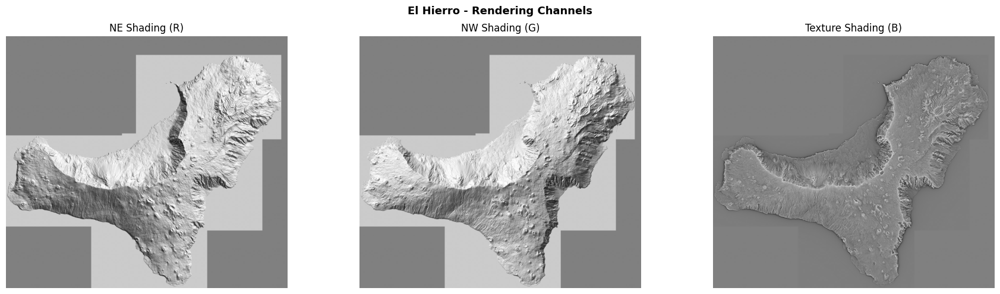

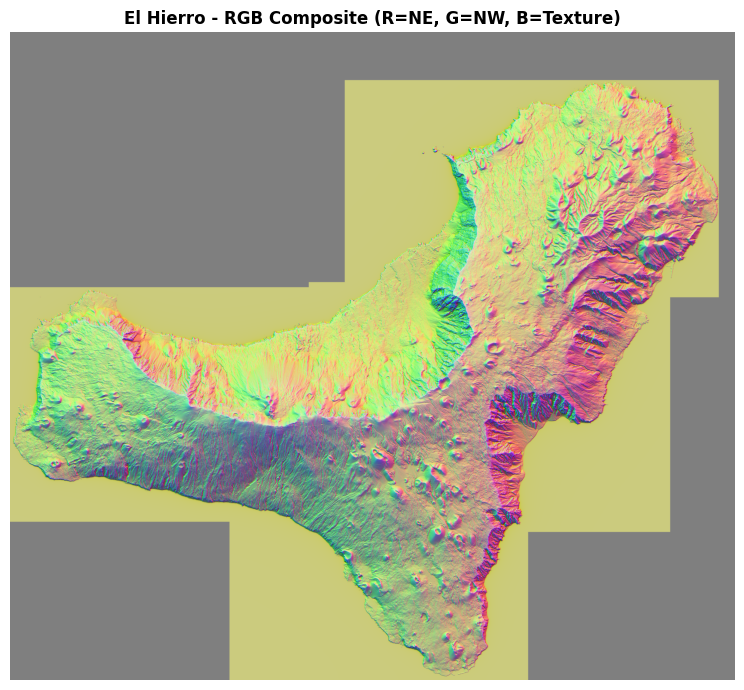

In [9]:
HIERRO_NE_PATH      = "Hierro/Hierro-Eduard-Analytical-NE.tiff"
HIERRO_NW_PATH      = "Hierro/Hierro-Eduard-Analytical-NW.tiff"
HIERRO_TEXTURE_PATH = "Hierro/Hierro-Eduard-Texture.tiff"

nodata_mask_h = np.isnan(dem_h)

composite_h, ne_h, nw_h, texture_h = build_composite(
    HIERRO_NE_PATH, HIERRO_NW_PATH, HIERRO_TEXTURE_PATH,
    nodata_mask_h
)

plot_channel_breakdown(ne_h, nw_h, texture_h, title_prefix="El Hierro")
plot_composite(composite_h, title_prefix="El Hierro")

#### Results: El Hierro

**Rendering Channels.**
The three channels are visually coherent and complementary as expected. The NE and NW shading panels act as nearly operational mirrors of each other with respect to illumination direction: slopes facing north-east appear bright in the NE channel and dark in the NW channel, and vice versa. This complementarity is precisely why both channels are included: no cone flank will be systematically lost in shadow regardless of its orientation. The Texture shading channel appears lower in overall contrast compared to the hillshade pair, but preserves morphological detail in an illumination-independent way: cone structures appear as subtle circular bumps with a consistent tonal signature across all aspect directions.

**RGB Composite.**
The composite immediately reveals the slope-orientation structure of the island through a vivid chromatic spectrum. A dominant yellow-olive/greenish tint covers the broad regional slopes where both NE and NW shading channels agree (high values in both Red and Green channels). The massive internal landslide scarp stands out sharply, transition-marking from a bright lime-green on its northward-facing cliffs to deep red-orange and purplish tones along the eastward-facing segments.

Critically, individual scoria cones stand out across the lower flanks as striking multi-colored circular anomalies. Because of their rotational symmetry, each cone acts as a local chromatic wheel: the flank facing the north-west illumination flashes in an intense green-cyan hue, while the opposing flank facing south-east transitions into a warm red-salmon to orange tone. This cyclic, dual-color ring pattern wraps entirely around the crater, providing a highly specific geometric signature that effectively highlights the structures.

### 2.4 - Run on Jeju

Same procedure applied to Jeju. No parameters change: the pipeline is fully dataset-agnostic at this stage.

Composite shape : (4364, 7761, 3)
Channel R (NE)  : min=0.000  max=1.000
Channel G (NW)  : min=0.000  max=1.000
Channel B (Tex) : min=0.000  max=1.000


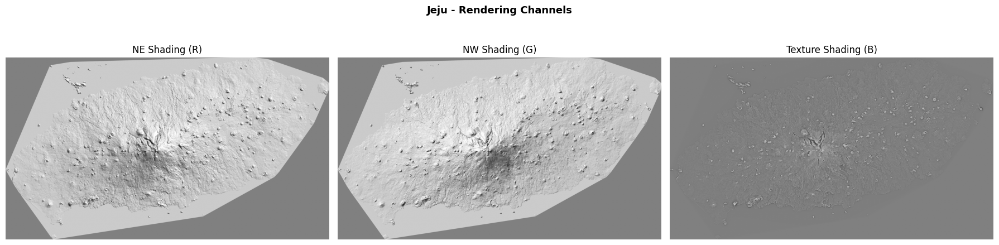

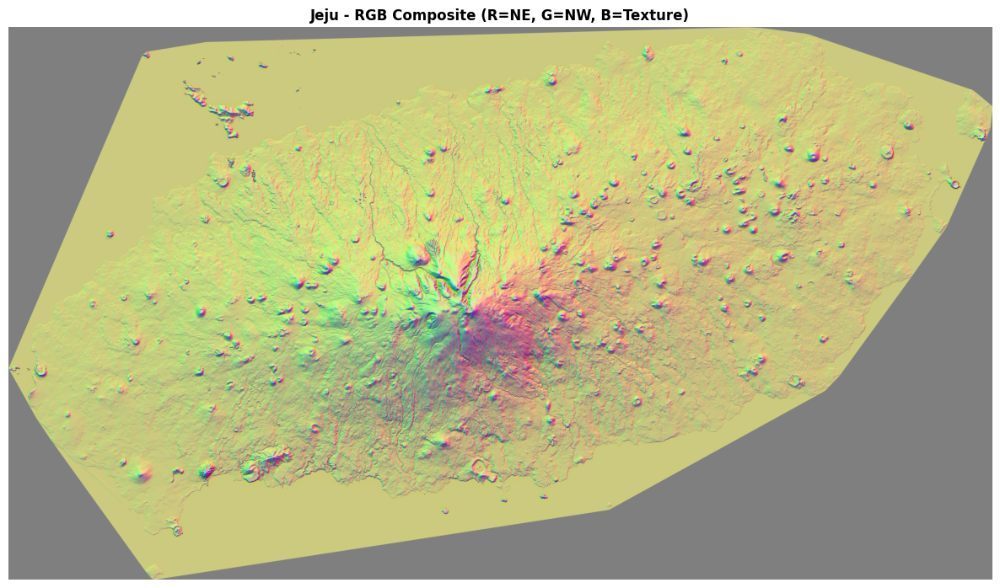

In [10]:
JEJU_NE_PATH      = "Jeju/Jeju-Eduard-Analytical-NE.tiff"
JEJU_NW_PATH      = "Jeju/Jeju-Eduard-Analytical-NW.tiff"
JEJU_TEXTURE_PATH = "Jeju/Jeju-Eduard-Texture.tiff"

nodata_mask_j = np.isnan(dem_j)

composite_j, ne_j, nw_j, texture_j = build_composite(
    JEJU_NE_PATH, JEJU_NW_PATH, JEJU_TEXTURE_PATH,
    nodata_mask_j
)

plot_channel_breakdown(ne_j, nw_j, texture_j, title_prefix="Jeju")
plot_composite(composite_j, title_prefix="Jeju")

#### Results: Jeju

**Rendering Channels.**
The NE and NW shading channels show the same complementary illumination behaviour seen on El Hierro, with the massive Hallasan shield volcano clearly dominating the centre of the grid. Across the lower flattish plains, dozens of small circular bumps are clearly visible in both hillshade channels: these are the secondary monogenetic scoria cones, each casting a characteristic asymmetric shadow depending on its aspect relative to the illumination direction.

The Texture shading channel is strikingly different from the hillshade pair: the overall image is very low in contrast, with most of the flat island surface appearing as a uniform grey. However, the cone structures emerge as small but distinct circular patches with a slightly brighter centre and a darker ring: the morphological signature of a crater rim as seen by a Laplacian-type operator.

**RGB Composite.**
The Jeju composite is visually the most informative result of this module. The vast flat plains appear as a highly uniform, homogeneous yellow-olive background (where Red and Green channels sit at similar mid-range values). Against this clean canvas, the island's volcanic field erupts into a spectacular distribution of small, glowing bi-colored rings.

Each individual scoria cone stands out as a distinct circular feature, splitting chromatically down the middle: one half glows in a vibrant green (high NW light, low NE light) and the opposite half shines in a pinkish-red (high NE light, low NW light), while the central crater depression often captures a darker, cooler core due to the texture shading contribution. The Hallasan massif dominates the center with a complex, dense mosaic of pink, red, and emerald-green patterns, reflecting its structural complexity and multi-directional steep slopes. The clear east-west elongation of the island's volcanic field is beautifully readable through the spatial density of these circular multi-colored signatures

## Module 3 - Knowledge-Driven Morphometric Filter

The continuous morphometric fields computed in Module 1 are here
translated into a baseline binary spatial filter. The filter encodes two geological constraints simultaneously:

1. **Slope**: pixels must fall in the textbook scoria cone flank
   window [25°, 35°], the angle-of-repose range for loose pyroclastic material.
2. **Roughness**: among all steep pixels, only those smoother than the median of their peers are retained. The threshold percentile is computed exclusively on slope-consistent pixels, so the comparison is geologically meaningful: *a cone flank is smooth relative to  other terrain at the same steepness*, not relative to the flat  plains or ocean border. Note: The roughness percentile threshold is adjusted per dataset based on the morphological regime.

No morphological post-processing is performed; spatial regularisation is delegated to Module 4.

In [11]:
def make_morphometric_mask(slope, roughness, slope_low=25.0, slope_high=35.0,
                            roughness_percentile=50):
    """
    Combined slope + Roughness mask:
    Slope condition: pixels in [slope_low, slope_high] degrees.
    Roughness threshold: computed on slope-consistent pixels only,
    so the comparison is 'smooth relative to terrain at the same steepness'.
    Only pixels below the threshold are retained.
    """
    slope_condition = (
        (~np.isnan(slope)) &
        (~np.isnan(roughness)) &
        (slope >= slope_low) & (slope <= slope_high)
    )

    steep_roughness = roughness[slope_condition]
    threshold       = np.percentile(steep_roughness, roughness_percentile)

    combined = (roughness <= threshold) & slope_condition

    n_steep    = slope_condition.sum()
    n_combined = combined.sum()
    print(f"Slope condition [{slope_low}°-{slope_high}°] : {n_steep:,} px")
    print(f"Roughness threshold [<= p{roughness_percentile} = {threshold:.2f} m] : "
          f"{n_combined:,} px ({100 * n_combined / n_steep:.1f}% of steep pixels retained)")

    return combined, threshold

### 3.1 - Visualisation

Two figures are produced for each dataset.

The **overlay figure** superimposes the combined mask on the NW shading rendering using a semi-transparent red tint, allowing direct visual assessment of which terrain features are selected and which are rejected.

The **detail zoom** shows a small region of the island at full resolution to verify that individual cone flanks are correctly isolated by the filter.

In [12]:
def plot_morphometric_mask(nw, combined_mask, title_prefix="",
                            row_center=None, col_center=None, half=300):
    """
    Two-panel figure: full overlay and detail zoom.
    """
    # --- full overlay ---
    base    = np.where(np.isnan(nw), 0.5, nw)
    overlay = np.stack([base, base, base], axis=-1)
    overlay[combined_mask, 0] = 1.0
    overlay[combined_mask, 1] = 0.2
    overlay[combined_mask, 2] = 0.2

    fig, ax = plt.subplots(figsize=(12, 7))
    ax.imshow(overlay)
    ax.set_title(f"{title_prefix} - Morphometric Mask Overlay",
                 fontsize=12, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

    # --- detail zoom ---
    valid_rows, valid_cols = np.where(~np.isnan(nw))
    if row_center is None:
        row_center = int(np.median(valid_rows))
    if col_center is None:
        col_center = int(np.median(valid_cols))

    r0, r1 = max(0, row_center - half), min(nw.shape[0], row_center + half)
    c0, c1 = max(0, col_center - half), min(nw.shape[1], col_center + half)

    nw_crop   = nw[r0:r1, c0:c1]
    mask_crop = combined_mask[r0:r1, c0:c1]

    base    = np.where(np.isnan(nw_crop), 0.5, nw_crop)
    overlay = np.stack([base, base, base], axis=-1)
    overlay[mask_crop, 0] = 1.0
    overlay[mask_crop, 1] = 0.2
    overlay[mask_crop, 2] = 0.2

    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(overlay)
    ax.set_title(f"{title_prefix} - Detail Zoom (row {r0}:{r1}, col {c0}:{c1})",
                 fontsize=11, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

### 3.2 - Run on El Hierro

Slope condition [25.0°-35.0°] : 2,010,605 px
Roughness threshold [<= p50 = 3.92 m] : 1,005,824 px (50.0% of steep pixels retained)


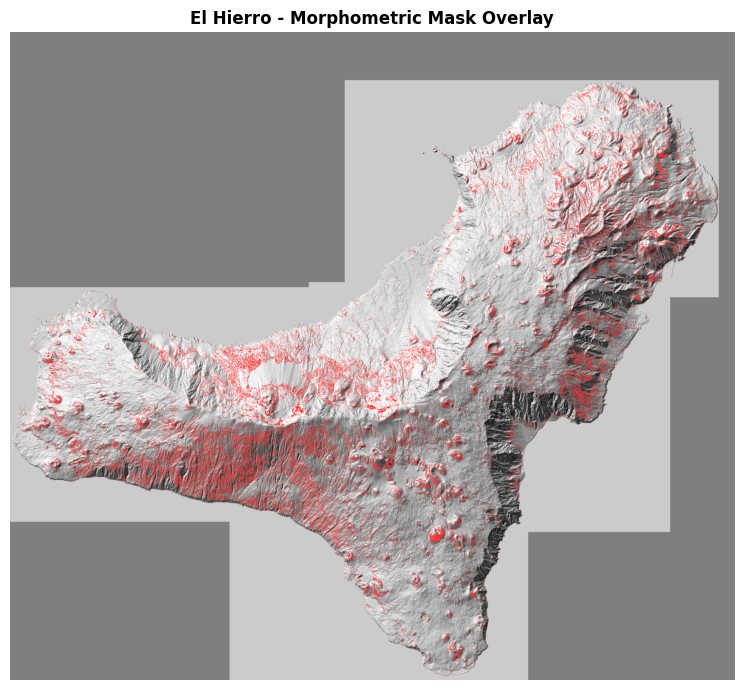

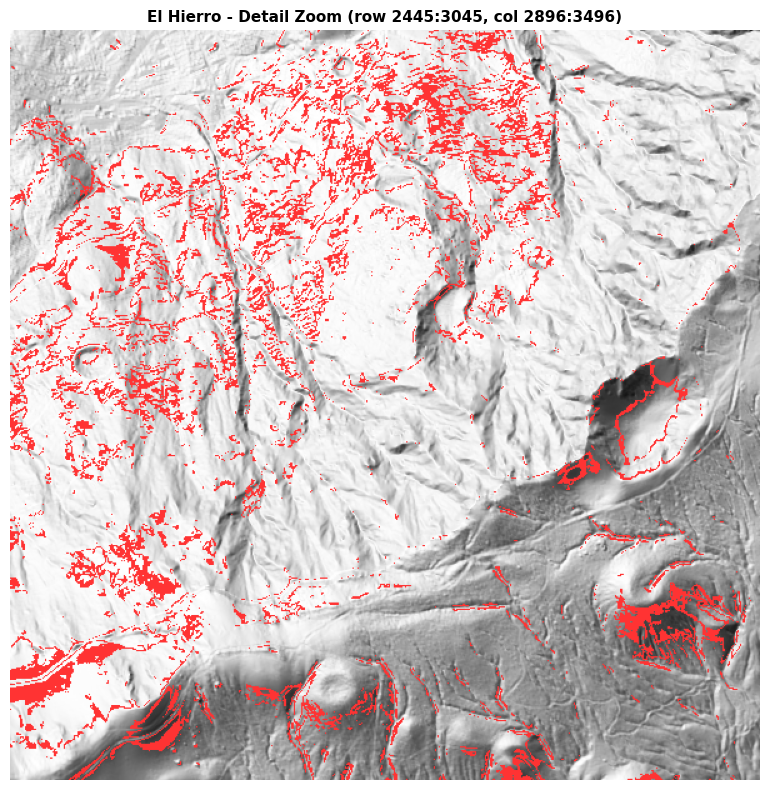

In [13]:
combined_mask_h, threshold_h = make_morphometric_mask(
    slope_h, roughness_h, roughness_percentile=50
)
plot_morphometric_mask(nw_h, combined_mask_h, title_prefix="El Hierro")


#### Results: El Hierro

```
Slope condition [25.0°-35.0°] : 2,010,605 px
Roughness threshold [<= p50 = 3.92 m] : 1,005,824 px (50.0% of steep pixels retained)
```

The slope condition selects 2,010,605 pixels, consistent with the 11.61%
of valid pixels identified in the slope histogram of Module 1. Among
these steep pixels, the median roughness is 3.92 m: exactly half are
smoother than this threshold and are retained, half are rougher and
discarded.

The 50% retention rate is by construction: the percentile choice
directly controls it. What matters geologically is *which* half
survives: the roughness filter correctly removes the steep-but-chaotic
terrain (eroded ridge crests, coastal scarps, lava channel margins)
while preserving the more homogeneous pyroclastic surfaces associated
with constructional cone morphology.

**Overlay.** The surviving pixels form two distinct spatial patterns.
First, **circular ring-shaped clusters** distributed across the
volcanic flanks of the island: these trace the steep, smooth flanks
of individual scoria cones, producing the annular signature expected
from a slope filter applied to a conical surface. Second, **linear
filaments** following ridge crests and structural lineaments: these
are false positives with compatible slope and roughness but elongated,
non-circular geometry that the morphometric filter alone cannot
eliminate.

**Detail zoom.** At cone scale, individual annular structures are
clearly resolved. The circular rings in the lower portion of the zoom
correspond to scoria cones correctly outlined by the mask. The linear
noise in the upper portion reflects the rift zone morphology, where
parallel ridges and erosional channels produce slope values in the
target window along their margins. Both patterns are expected and will
be addressed in Module 4 through the circularity and shape constraints
of the LoG detector and the Random Forest classifier.



### 3.3 - Run on Jeju

Slope condition [25.0°-35.0°] : 304,937 px
Roughness threshold [<= p75 = 8.10 m] : 228,703 px (75.0% of steep pixels retained)


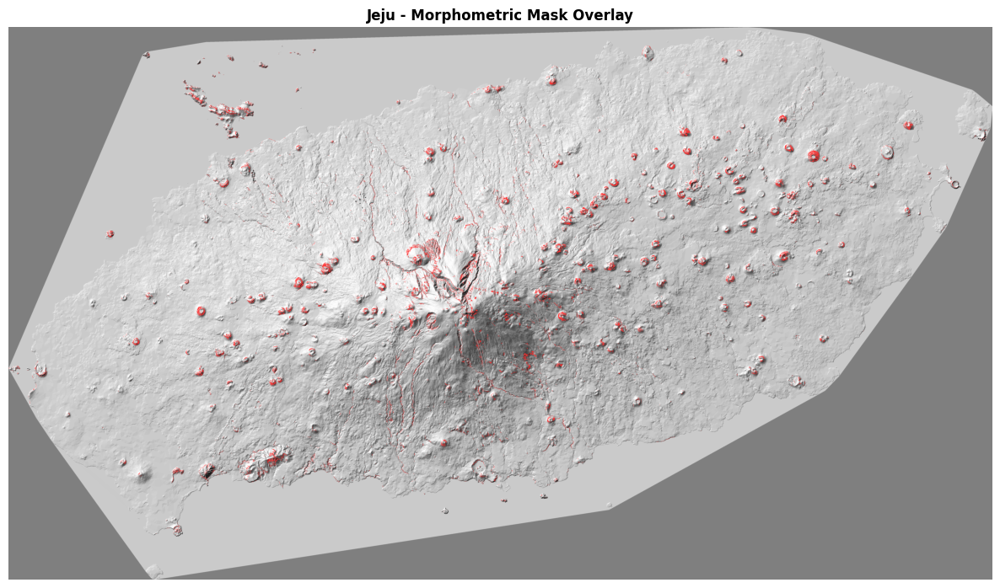

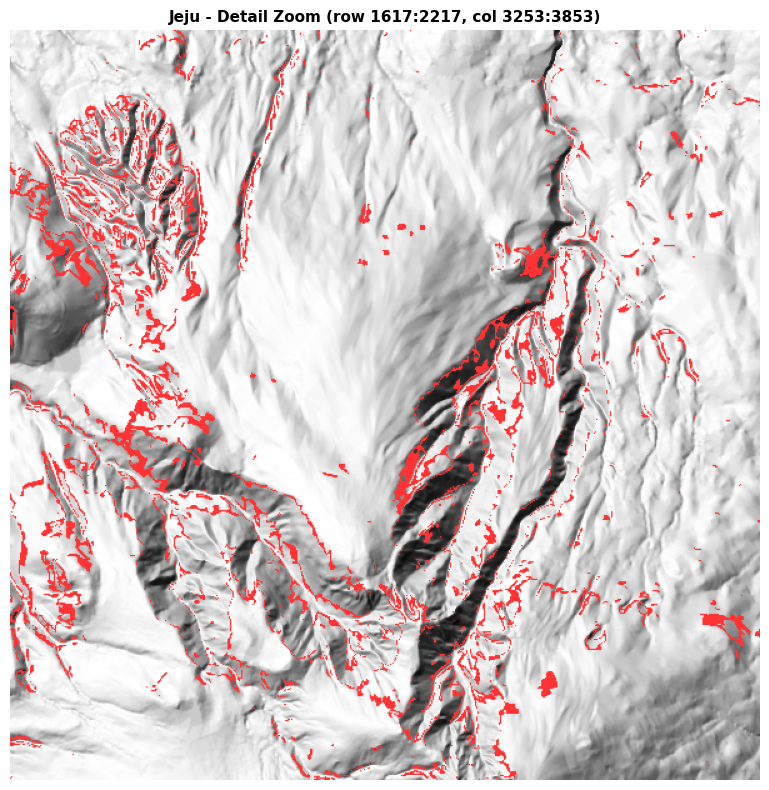

In [14]:
combined_mask_j, threshold_j = make_morphometric_mask(
    slope_j, roughness_j, roughness_percentile=75
)
plot_morphometric_mask(nw_j, combined_mask_j, title_prefix="Jeju")

#### Results: Jeju

```
Slope condition [25.0°-35.0°] : 304,937 px
Roughness threshold [<= p75 = 8.10 m] : 228,703 px (75.0% of steep pixels retained)
```

A more permissive percentile (75 instead of 50) is used on Jeju.
The motivation is qualitative: visual inspection of the overlay
confirms that Jeju's steep pixels are already a very clean population:
the flat basaltic plains dominate the island surface, and essentially
all pixels in the 25°-35° slope window correspond to genuine cone
flanks or Hallasan massif terrain. Applying the median threshold would
discard half of an already-sparse and mostly-valid signal. The 75th
percentile retains the smoother 75% while still removing the roughest
quarter, which corresponds primarily to the complex multi-directional
erosional terrain of the central Hallasan drainage network.

**Overlay.** The result is visually striking: dozens of clean circular
rings mark individual scoria cones (*oreums*) across the eastern and
western plains, with minimal background noise. The Hallasan massif
contributes some signal along its steeper flanks and drainage channels,
but the overall spatial pattern is dominated by the isolated,
geometrically well-defined secondary cones: a substantially cleaner
result than El Hierro, consistent with the simpler morphological
context of a low-relief basaltic shield.

**Detail zoom.** The zoom is centred on the Hallasan massif region.
The selected pixels here follow the margins of steep drainage channels
and structural scarps rather than circular cone outlines: the expected
signature of non-conical terrain that satisfies the slope criterion
along its edges. These false positives will be suppressed in Module 4
by the circularity constraint of the LoG detector.

---
## Module 4 - Candidate Detection and ML-Based Classification

The morphometric filter of Module 3 provides a physically motivated binary mask that isolates pixels geometrically consistent with scoria cone flanks. However, the mask operates at the pixel level: it does not group pixels into candidate structures, does not enforce circularity, and (as shown on El Hierro) retains a substantial fraction of non-cone terrain (ridge flanks, lava channel margins, coastal scarps) that satisfies the slope and roughness criteria by coincidence.

Module 4 advances from pixel-level filtering to object-level detection and classification.

The pipeline operates in three stages:

#### Stage 1 - Blob Detection (LoG).
A Laplacian of Gaussian detector is applied to the texture shading rendering to extract thousands of circular candidate structures. The detector is configured permissively: high recall is the primary objective at this stage, even at the cost of a large number of false positives. The morphometric mask from Module 3 is used as a spatial validator to suppress candidates with insufficient overlap with the cone-consistent terrain.

#### Stage 2 - Feature Extraction.
Each candidate blob is described by a feature vector of zonal statistics computed from the morphometric maps of Module 1 (slope, roughness, aspect) and from the texture shading signal itself. These features encode the geometric and physical properties of each candidate in a compact, fixed-length representation.

#### Stage 3 - Random Forest Classification.
The candidates are labelled against the El Hierro ground truth annotations. A Random Forest classifier is trained to distinguish true cones from false positives using the extracted features. The trained model is then evaluated quantitatively on El Hierro and applied qualitatively to Jeju.

The rationale for this two-step architecture: permissive detection followed by learned discrimination, is that the problem has asymmetric costs at each stage. Missing a true cone at the detection stage is irrecoverable; a false positive at the detection stage can be eliminated by the classifier. The LoG detector is therefore tuned for recall, and the burden of precision is delegated to the Random Forest.

### 4.1 - El Hierro Ground Truth Loading

Before any detection, the ground truth annotations for El Hierro are loaded from the shapefile.

The shapefile contains, for each annotated cone, two geometry types identified by the field Id: the crater outline (Id = 2) and the base perimeter (Id = 1). The ground truth used throughout Module 4 is the centroid of the crater outline (Id = 2), which provides a single representative point per cone.

In [15]:
import geopandas as gpd
from rasterio.transform import rowcol

CONES_SHP_PATH = "Hierro/Cones/Cones.shp"

In [16]:
def load_ground_truth(shp_path, transform, target_crs):
    """
    Load crater centroids (Id=2) from the annotation shapefile.
    Returns a DataFrame with pixel coordinates (px_row, px_col) and geographic coordinates (gt_x, gt_y) for each annotated cone.
    """
    gdf = gpd.read_file(shp_path)

    if gdf.crs != target_crs:
        gdf = gdf.to_crs(target_crs)

    craters = gdf[gdf["Id"] == 2].copy()
    craters["centroid"] = craters.geometry.centroid
    craters["gt_x"]     = craters["centroid"].x
    craters["gt_y"]     = craters["centroid"].y

    rows, cols = [], []
    for _, row in craters.iterrows():
        r, c = rowcol(transform, row["gt_x"], row["gt_y"])
        rows.append(r)
        cols.append(c)

    craters["px_row"] = rows
    craters["px_col"] = cols

    print(f"Ground truth loaded: {len(craters)} crater centroids")
    return craters[["coni", "gt_x", "gt_y", "px_row", "px_col"]].reset_index(drop=True)


gt_h = load_ground_truth(CONES_SHP_PATH, transform_h, crs_h)

Ground truth loaded: 196 crater centroids


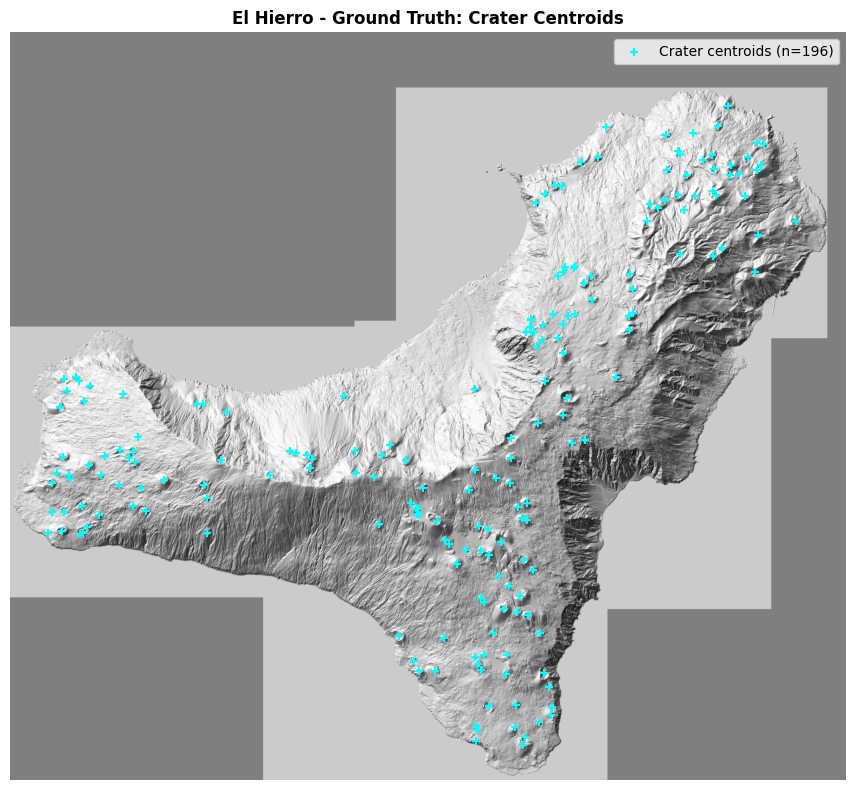

In [17]:
def plot_ground_truth(nw, gt_df, title_prefix=""):
    """
    Visualise crater centroids overlaid on NW shading.
    """
    base    = np.where(np.isnan(nw), 0.5, nw)
    display = np.stack([base, base, base], axis=-1)

    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(display)
    ax.scatter(gt_df["px_col"], gt_df["px_row"],
               s=30, c="cyan", marker="+",
               linewidths=1.5, label=f"Crater centroids (n={len(gt_df)})")
    ax.set_title(f"{title_prefix} - Ground Truth: Crater Centroids",
                 fontsize=12, fontweight="bold")
    ax.legend()
    ax.axis("off")
    plt.tight_layout()
    plt.show()


plot_ground_truth(nw_h, gt_h, title_prefix="El Hierro")

### 4.2 - Stage 1: LoG Blob Detection

The Laplacian of Gaussian (LoG) operator is a classical circular blob detector.

Conceptually, it convolves the image with a Gaussian kernel at a given scale $\sigma$, then applies the
Laplacian (second derivative) to find regions where intensity transitions rapidly from a bright  interior to a darker surround, the signature of a circular bump. By sweeping $\sigma$ across a range of values, the detector identifies circular structures at multiple scales simultaneously.
The radius of a detected blob is approximately related to $\sigma$ by $r \approx \sigma\sqrt{2}$.

On the texture shading rendering, scoria cones appear as local bright circular bumps. The LoG detector is therefore a natural fit: it is sensitive to circularly symmetric intensity variations and scale-invariant by construction.

The detector is configured with high permissiveness: a low response threshold and a wide radius  range. This is an intentional design choice: at this stage, the goal is to ensure that every true cone produces at least one candidate; false positives are acceptable and will be removed
in Stage 3.

A candidate is additionally required to overlap with the morphometric mask from Module 3 by at
least a minimum fraction of its area (`min_mask_frac`). This spatial consistency check eliminates
blobs detected in regions morphometrically incompatible with cone flanks, without relying on the
classifier.

**Computational note.** The El Hierro DEM at 5 m/px produces a ~5000x5600 px raster. Running
LoG directly at full resolution with 10 sigma levels is prohibitively slow (around 10 min). We
therefore downsample both the texture and the mask by a factor of 2 before detection. At the
downsampled resolution (10 m/px effective), the smallest cone of interest (radius 60 m) still
corresponds to ~6 px (well above the minimum detectable size). Blob coordinates are rescaled back to the original pixel space after detection.


In [18]:
from skimage.transform import downscale_local_mean

def prepare_log_inputs(texture, combined_mask, downsample_factor=2):
    """
    Downsample texture and mask before LoG detection.
    """
    texture_ds = downscale_local_mean(
        np.nan_to_num(texture, nan=0.0),
        (downsample_factor, downsample_factor)
    )
    mask_ds = downscale_local_mean(
        combined_mask.astype(np.float32),
        (downsample_factor, downsample_factor)
    ) > 0.5

    print(f"Original shape : {texture.shape}")
    print(f"Downsampled    : {texture_ds.shape}  (factor {downsample_factor}x)")
    return texture_ds, mask_ds


def detect_candidates_log(texture_ds, mask_ds, res_metres_ds,
                          min_radius_m=60, max_radius_m=300,
                          num_sigma=6, threshold_log=0.03,
                          overlap=0.5, min_mask_frac=0.05):
    """
    LoG blob detection on a (pre-downsampled) texture.
    All radius parameters are in metres; conversion to sigma uses res_metres_ds.
    """
    min_sigma = (min_radius_m  / res_metres_ds) / np.sqrt(2)
    max_sigma = (max_radius_m  / res_metres_ds) / np.sqrt(2)

    img_masked = texture_ds * mask_ds.astype(np.float64)

    print(f"Running LoG  (sigma range [{min_sigma:.1f}, {max_sigma:.1f}], "
          f"{num_sigma} levels)...")
    blobs = blob_log(
        img_masked,
        min_sigma  = min_sigma,
        max_sigma  = max_sigma,
        num_sigma  = num_sigma,
        threshold  = threshold_log,
        overlap    = overlap
    )

    if len(blobs) == 0:
        print("No blobs detected.")
        return pd.DataFrame(columns=["row", "col", "radius_px",
                                     "radius_m", "log_response", "mask_frac"])

    rows_b = blobs[:, 0].astype(int)
    cols_b = blobs[:, 1].astype(int)
    sigmas = blobs[:, 2]
    radii  = (sigmas * np.sqrt(2)).astype(int)

    H, W   = texture_ds.shape
    records = []

    for r, c, sigma, radius in zip(rows_b, cols_b, sigmas, radii):
        r0, r1 = max(0, r - radius), min(H, r + radius + 1)
        c0, c1 = max(0, c - radius), min(W, c + radius + 1)

        rr, cc       = np.ogrid[r0:r1, c0:c1]
        circle_local = (rr - r)**2 + (cc - c)**2 <= radius**2
        mask_crop    = mask_ds[r0:r1, c0:c1]

        area       = circle_local.sum()
        mask_cover = (mask_crop & circle_local).sum()
        mask_frac  = mask_cover / area if area > 0 else 0.0

        if mask_frac < min_mask_frac:
            continue

        records.append({
            "row"         : r,
            "col"         : c,
            "radius_px"   : radius,
            "radius_m"    : radius * res_metres_ds,
            "log_response": sigma**2 * np.abs(img_masked[r, c]),
            "mask_frac"   : mask_frac,
        })

    candidates = pd.DataFrame(records)
    print(f"LoG blobs detected : {len(blobs):,}")
    print(f"After mask filter  : {len(candidates):,} candidates retained")
    return candidates


def rescale_candidates(candidates, downsample_factor):
    """
    Rescale row, col, radius_px from downsampled space back to original pixel space.
    """
    candidates = candidates.copy()
    candidates["row"]       *= downsample_factor
    candidates["col"]       *= downsample_factor
    candidates["radius_px"] *= downsample_factor
    return candidates

#### 4.2.1 - Evaluation on El Hierro

Candidates are matched against the ground truth crater centroids using a greedy nearest-neighbour strategy at a spatial tolerance of 200 m. A ground truth cone is counted as a true positive (TP)
if at least one candidate falls within the tolerance radius; unmatched candidates are false positives (FP); unmatched ground truth cones are false negatives (FN).

In [19]:
def evaluate_detections(candidates, gt_df, tolerance_m, res_metres):
    """
    Compute precision, recall and F1 by matching candidates to ground truth.
    A GT cone is a TP if at least one candidate falls within tolerance_m.
    A candidate is a FP if it matches no GT cone within tolerance_m.
    Each GT cone can be matched by at most one candidate (greedy nearest).
    """
    if len(candidates) == 0:
        return {"tp": 0, "fp": 0, "fn": len(gt_df),
                "precision": 0.0, "recall": 0.0, "f1": 0.0}

    candidates = candidates.reset_index(drop=True)  # fix qui

    tol_px        = tolerance_m / res_metres
    matched_cands = set()
    tp_gt         = 0

    for _, gt in gt_df.iterrows():
        dists   = np.sqrt(
            (candidates["row"].values - gt["px_row"])**2 +
            (candidates["col"].values - gt["px_col"])**2
        )
        idx_min = dists.argmin()
        if dists[idx_min] <= tol_px:
            tp_gt += 1
            matched_cands.add(idx_min)

    precision = len(matched_cands) / len(candidates) if len(candidates) > 0 else 0.0
    recall    = tp_gt / len(gt_df)
    f1        = (2 * precision * recall / (precision + recall)
                 if (precision + recall) > 0 else 0.0)

    return {"tp": tp_gt, "fp": len(candidates) - len(matched_cands),
            "fn": len(gt_df) - tp_gt,
            "precision": precision, "recall": recall, "f1": f1}

#### Parameter Configuration

The LoG detector exposes six parameters that jointly control the scale range,
sensitivity, and spatial resolution of the candidate pool.

| Parameter | Value | Role |
|---|---|---|
| `min_radius_m` | 60 m | Minimum detectable cone radius. Sets the lower bound of the $\sigma$ range via $\sigma_{min} = r_{min} / \sqrt{2}$. Covers small satellite cones without descending into sub-resolution noise. |
| `max_radius_m` | 400 m | Maximum detectable cone radius. Chosen to include large oreums on Jeju while excluding shield-scale structures that are not monogenetic cones. |
| `num_sigma` | 10 | Number of $\sigma$ levels sampled between $\sigma_{min}$ and $\sigma_{max}$. More levels reduce the inter-scale gap, limiting over-segmentation where a single cone produces responses at multiple adjacent scales. |
| `threshold_log` | 0.03 | Minimum normalised LoG response to retain a blob. Kept deliberately low to maximise recall; false positives at this stage are acceptable and handled by the classifier. |
| `overlap` | 0.3 | Maximum fractional area overlap allowed between two retained blobs. Blobs exceeding this threshold are merged, keeping the stronger response. Controls duplicate suppression for spatially clustered candidates. |
| `min_mask_frac` | 0.05 | Minimum fraction of the blob disk that must overlap the morphometric mask from Module 3. Eliminates blobs detected in morphometrically incompatible regions without invoking the classifier. |

The parameters used here were selected following preliminary grid search experiments and represent a configuration  that maximises recall while keeping the candidate pool to a manageable size.

In [20]:
DS_FACTOR = 2
res_ds_h  = res_h[0] * DS_FACTOR

texture_ds_h, mask_ds_h = prepare_log_inputs(texture_h, combined_mask_h, DS_FACTOR)

candidates_ds_h = detect_candidates_log(
    texture_ds   = texture_ds_h,
    mask_ds      = mask_ds_h,
    res_metres_ds= res_ds_h,
    min_radius_m = 60,
    max_radius_m = 400,
    threshold_log= 0.03,
    min_mask_frac= 0.05,
    num_sigma    = 10,
    overlap      = 0.3
)

candidates_h = rescale_candidates(candidates_ds_h, DS_FACTOR)
print(f"\nCandidates in original pixel space: {len(candidates_h)}")

Original shape : (5081, 5681)
Downsampled    : (2541, 2841)  (factor 2x)
Running LoG  (sigma range [4.2, 28.3], 10 levels)...
LoG blobs detected : 3,581
After mask filter  : 3,460 candidates retained

Candidates in original pixel space: 3460


In [21]:
metrics_log_h = evaluate_detections(candidates_h, gt_h, 200, res_h[0])
print(f"\nLoG detector - El Hierro")
print(f"  Candidates  : {len(candidates_h)}")
print(f"  TP         : {metrics_log_h['tp']}")
print(f"  FP         : {metrics_log_h['fp']}")
print(f"  FN         : {metrics_log_h['fn']}")
print(f"  Recall     : {metrics_log_h['recall']:.3f}")
print(f"  Precision  : {metrics_log_h['precision']:.3f}")
print(f"  F1         : {metrics_log_h['f1']:.3f}")


LoG detector - El Hierro
  Candidates  : 3460
  TP         : 189
  FP         : 3282
  FN         : 7
  Recall     : 0.964
  Precision  : 0.051
  F1         : 0.098


The results confirm the expected behaviour of a permissively configured detector.

With a recall of **0.964**, the LoG stage recovers 189 of the 196 annotated cones: the 7 missed cones are
morphologically marginal cases (very small or heavily eroded) that produce a sub-threshold response at all tested sigma levels. Precision, at **0.051**, is expectedly very low: the 3282 false positives include circular lava flow fronts, erosion bowls, coastal scarps, and topographic anomalies that satisfy the LoG circularity criterion without any underlying conical
morphology. Adjusting the detector threshold to reduce false positives would inevitably sacrifice recall: a trade-off that no single threshold can resolve on terrain as geologically
complex as El Hierro.

This structural limitation of threshold-based blob detection motivates the transition to a learned classifier in Stage 3.

#### The Precision/Recall Trade-off: A High-Precision Counter-Experiment

To quantitatively prove this structural limitation and explore the hyperparameter space, a counter-experiment was conducted by tightening the detector criteria. By exploiting the insight gained from a preliminary grid search, the threshold was raised (`threshold_log = 0.08`) and the minimum scale constraint was restricted (`min_radius_m = 100`).

In [22]:
candidates_hp_ds = detect_candidates_log(
    texture_ds    = texture_ds_h,
    mask_ds       = mask_ds_h,
    res_metres_ds = res_ds_h,
    min_radius_m  = 100,
    max_radius_m  = 400,
    threshold_log = 0.08,
    min_mask_frac = 0.05,
    num_sigma     = 6,
    overlap       = 0.5
)

candidates_hp_h = rescale_candidates(candidates_hp_ds, DS_FACTOR)
metrics_hp_h = evaluate_detections(candidates_hp_h, gt_h, 200, res_h[0])

print(f"\nLoG High-Precision Test - El Hierro")
print(f"  Candidates : {len(candidates_hp_h)}")
print(f"  TP         : {metrics_hp_h['tp']}")
print(f"  FP         : {metrics_hp_h['fp']}")
print(f"  FN         : {metrics_hp_h['fn']}")
print(f"  Recall     : {metrics_hp_h['recall']:.3f}")
print(f"  Precision  : {metrics_hp_h['precision']:.3f}")
print(f"  F1         : {metrics_hp_h['f1']:.3f}")

Running LoG  (sigma range [7.1, 28.3], 6 levels)...
LoG blobs detected : 464
After mask filter  : 464 candidates retained

LoG High-Precision Test - El Hierro
  Candidates : 464
  TP         : 111
  FP         : 362
  FN         : 85
  Recall     : 0.566
  Precision  : 0.220
  F1         : 0.317


The empirical results dynamically illustrate the recall/precision trade-off:

By driving the response threshold up, the standalone LoG filter achieves an higher mathematical equilibrium ($F1 = 0.317$) and sharpens the Precision up to 22.0%. However, this statistical tightening comes at an unacceptable geological cost: **the Recall collapses to 56.6%**, meaning that 85 true scoria cones are completely missed and erased from the workflow.

In a cascaded architecture, a drop in Recall at the initial detection stage represents an **irrecoverable loss**, since the subsequent machine learning classifier can only audit and filter the candidates it receives. A missed cone at this stage is missed forever. Consequently, we firmly reject this balanced setup and proceed with the highly permissive configuration (Recall = 0.964, Candidates = 3,460), intentionally transferring the entire burden of precision enforcement to the multi-channel Random Forest classifier in Stage 3.

#### 4.2.2 - Application to Jeju

The same detection pipeline is applied to Jeju without any parameter adjustment. Since no ground truth annotations are available for Jeju, evaluation is purely qualitative: the candidate set is inspected visually to assess whether the detector responds to morphologically plausible
structures.

In [23]:
DS_FACTOR = 2
res_ds_j  = res_j[0] * DS_FACTOR

texture_ds_j, mask_ds_j = prepare_log_inputs(texture_j, combined_mask_j, DS_FACTOR)

candidates_ds_j = detect_candidates_log(
    texture_ds    = texture_ds_j,
    mask_ds       = mask_ds_j,
    res_metres_ds = res_ds_j,
    min_radius_m = 60,
    max_radius_m = 400,
    threshold_log= 0.03,
    min_mask_frac= 0.05,
    num_sigma    = 10,
    overlap      = 0.3
)

candidates_j = rescale_candidates(candidates_ds_j, DS_FACTOR)
print(f"\nCandidates in original pixel space: {len(candidates_j)}")

Original shape : (4364, 7761)
Downsampled    : (2182, 3881)  (factor 2x)
Running LoG  (sigma range [2.1, 14.1], 10 levels)...
LoG blobs detected : 3,602
After mask filter  : 3,602 candidates retained

Candidates in original pixel space: 3602


#### Results: Jeju Generalisation

The direct transfer of the permissive LoG configuration to the Jeju dataset yields **3,602 candidates** in the original pixel space. Notably, even though Jeju's spatial grid footprint is nearly double that of El Hierro, the total volume of extracted candidates remains comparable (3,602 vs. 3,460).

Since Jeju lacks a structural ground-truth shapefile, a purely quantitative cross-validation is impossible. The spatial validity of these 3,602 candidates must be audited visually using global and localized overlays. Visually, we expect a dual response: a highly precise mapping of isolated *oreums* (secondary scoria cones) on the plains, contrasted with a high concentration of structural, multi-directional false positives clustered around the steep, non-conical drainage networks of the central Hallasan shield massif. This clear spatial divide further underlines the necessity of the Stage 2 zonal machine learning filtering to rigorously isolate true constructional cones.

#### Visual Analysis

In [24]:
import matplotlib.patches as mpatches

def plot_candidates_overlay(nw, candidates, gt_df=None, title_prefix=""):
    """
    Overlay LoG candidates (red circles) and GT centroids (cyan crosses) over NW shading.
    """
    base    = np.where(np.isnan(nw), 0.5, nw)
    display = np.stack([base, base, base], axis=-1)

    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(display)

    for _, c in candidates.iterrows():
        circle = mpatches.Circle(
            (c["col"], c["row"]), radius=c["radius_px"],
            fill=False, edgecolor="red", linewidth=0.5, alpha=0.5
        )
        ax.add_patch(circle)

    if gt_df is not None:
        ax.scatter(gt_df["px_col"], gt_df["px_row"],
                   s=40, c="cyan", marker="+",
                   linewidths=1.5, zorder=5,
                   label=f"GT centroids (n={len(gt_df)})")

    handles = [mpatches.Patch(edgecolor="red", facecolor="none",
                               label=f"LoG candidates (n={len(candidates)})")]
    if gt_df is not None:
        handles.append(plt.Line2D([0], [0], marker="+", color="cyan",
                                   linestyle="none", markersize=8,
                                   label=f"GT centroids (n={len(gt_df)})"))
    ax.legend(handles=handles, fontsize=9)
    ax.set_title(f"{title_prefix} - LoG Candidates", fontsize=12, fontweight="bold")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

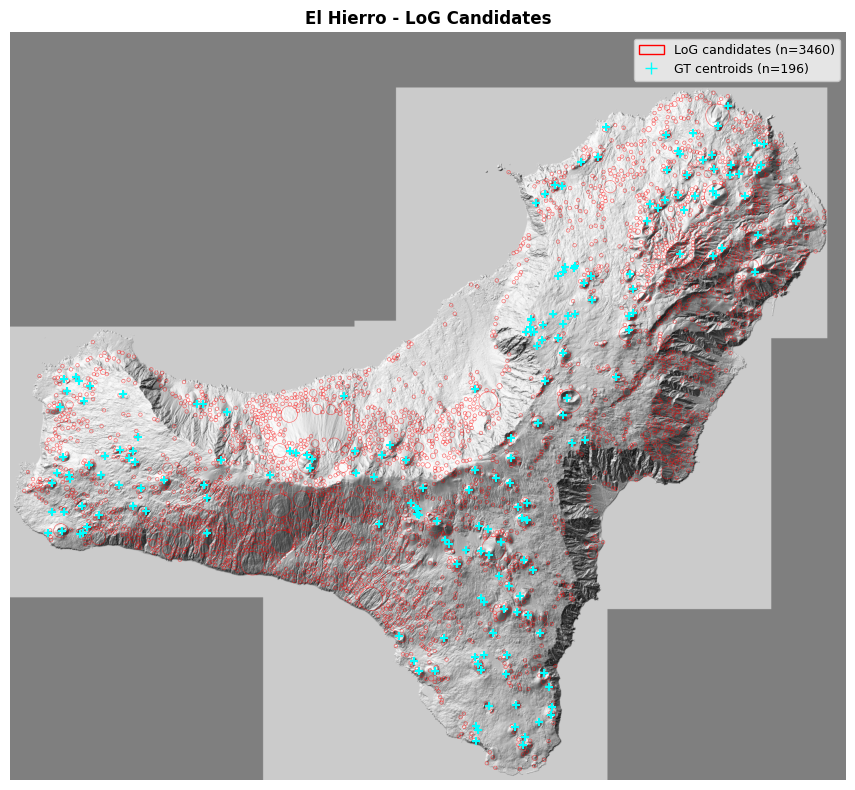

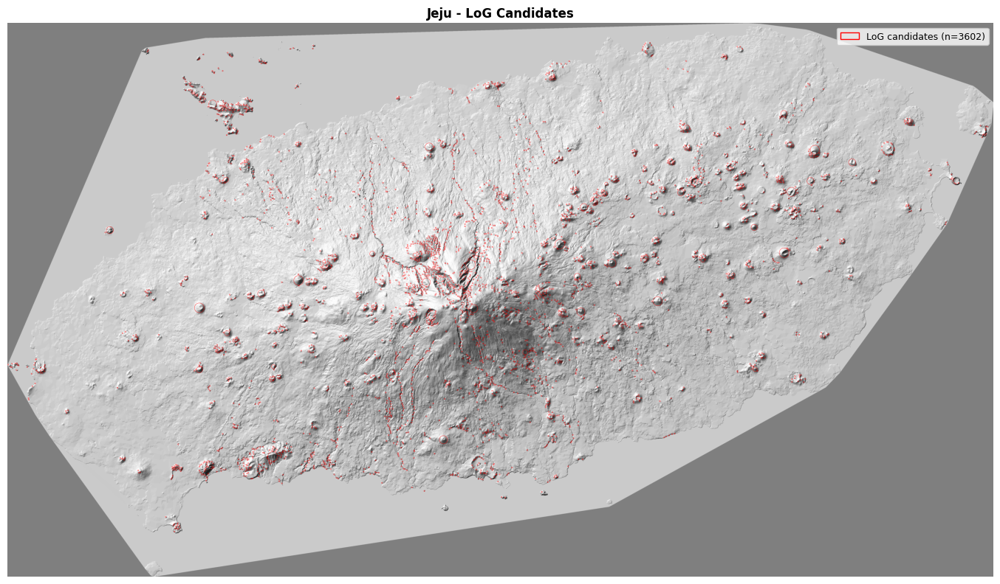

In [25]:
plot_candidates_overlay(nw_h, candidates_h, gt_df=gt_h, title_prefix="El Hierro")
plot_candidates_overlay(nw_j, candidates_j, gt_df=None,  title_prefix="Jeju")

#### Visual Analysis of Spatial Distributions

**El Hierro Overlay:**
The global overlay confirms the recall figure of 96.4%: virtually
every cyan ground-truth centroid is covered by at least one red
candidate circle. However, the spatial distribution of candidates
reveals the structural limitation of the unsupervised LoG filter.
False positives are not concentrated in a single region but
distributed across the entire island, wherever the texture shading
presents circular intensity gradients of the right scale, regardless
of their volcanic origin. The north-eastern rift zone and the
*El Golfo* erosional amphitheatre are particularly dense: the
crescent-shaped collapse scarp and the deeply incised drainage
channels of these areas generate high-amplitude Laplacian responses
that are geometrically indistinguishable from cone flanks at the
detector level. The result is a candidate pool where true cones are
reliably present but heavily outnumbered, with a precision of 5.1%
that no threshold adjustment can meaningfully improve without
sacrificing recall.

**Jeju Overlay:**
The Jeju result is visually cleaner than El Hierro, a direct
consequence of the improved morphometric mask. The peripheral plains: east and west flanks show well-isolated candidate circles
closely matching individual *oreums*, with little background noise.
However, the central Hallasan massif still concentrates a cluster of false
positives along its steep drainage channels and structural scarps. The geographic split between the clean peripheral field and the noisier central massif is clearly legible and consistent with the known geology of the island.

**Conclusion for Stage 1:**
Across both islands, the primary source of false positives is
identical: **topographic lineaments and erosional structures
masquerading as circular features**. The LoG detector is sensitive
to any circularly symmetric intensity gradient at the target scale,
irrespective of its physical origin. No threshold or scale
adjustment can resolve this ambiguity at the geometric level alone,
as the counter-experiment in Section 4.2.1 demonstrated, tightening
the detector to improve precision inevitably collapses recall to
unacceptable levels. This structural limitation definitively
motivates the transition to Stage 2: a learned classifier that
evaluates each candidate not by its shape alone, but by the full
multi-channel physical signature of the terrain inside and around it.

#### A Note on Jeju Morphological Simplicity

The visual inspection of the Jeju candidate map suggests that the island's terrain presents a structurally simpler detection environment than El Hierro. The low-relief basaltic plains
produce very little background LoG response, and the main source of noise is geographically concentrated around the central Hallasan massif, a single, well-defined confounding structure
rather than the distributed erosional complexity of El Hierro.

This raises a natural question: can tighter detector parameters suppress the Hallasan noise while preserving the peripheral oreums?

Running LoG  (sigma range [3.5, 17.7], 6 levels)...
LoG blobs detected : 497
After mask filter  : 497 candidates retained

Cleaned Candidates in original pixel space: 497


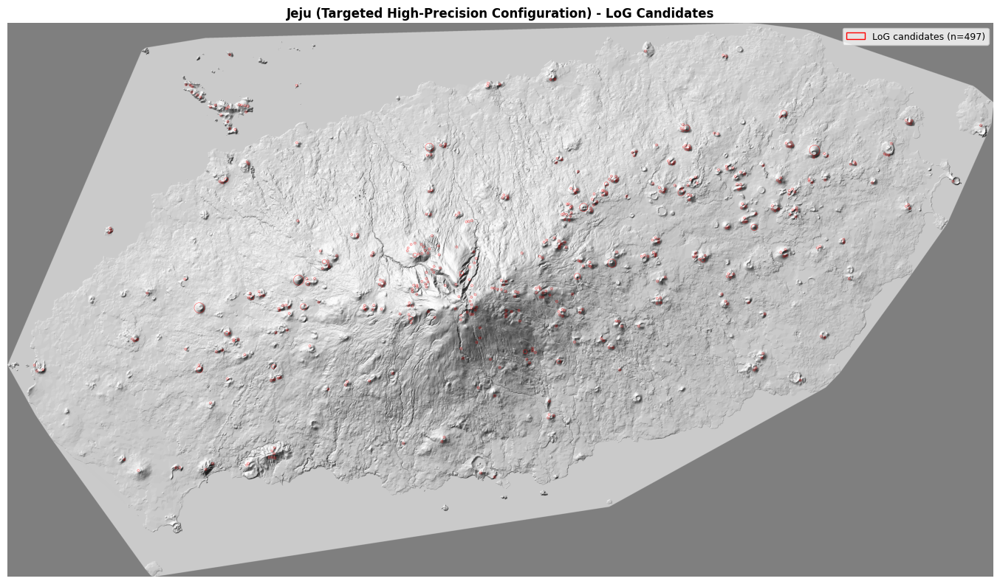

In [26]:
# Optimized parameters (we don't want to consider central Hallasan noise)
candidates_hp_ds_j = detect_candidates_log(
    texture_ds    = texture_ds_j,
    mask_ds       = mask_ds_j,
    res_metres_ds = res_ds_j,
    min_radius_m  = 100,
    max_radius_m  = 500,
    threshold_log = 0.12,
    min_mask_frac = 0.05,
    num_sigma     = 6,
    overlap       = 0.3
)

candidates_clean_j = rescale_candidates(candidates_hp_ds_j, DS_FACTOR)

print(f"\nCleaned Candidates in original pixel space: {len(candidates_clean_j)}")

plot_candidates_overlay(
    nw           = nw_j,
    candidates   = candidates_clean_j,
    gt_df        = None,
    title_prefix = "Jeju (Targeted High-Precision Configuration)"
)

The tightened configuration reduces the candidate pool from 3,602 to 497 and visually the Hallasan cluster is substantially suppressed. The peripheral oreums remain well-covered.

However, this result does not translate into a general good solution. The parameters that maybe work here were chosen by visual inspection of Jeju specifically; applied to El Hierro, the same threshold
would collapse recall to ~0.50, as the counter-experiment in Section 4.2.1 demonstrated. A detection pipeline that requires manual, island-specific tuning is not portable.

We therefore return to the permissive configuration (threshold = 0.03, candidates = 3,602) as the Jeju input to Stage 3. The task of separating oreums from Hallasan artefacts is delegated
to the Random Forest classifier, which will have to generalise from El Hierro training data to Jeju terrain: a cross-domain challenge examined in Section 4.5.

### 4.3 - Stage 2: Feature Extraction

The LoG stage produces a candidate pool with high recall but very low precision: 3,460 circular regions have been extracted, but only 189 of them correspond to true scoria cones. To distinguish true cones from false positives, each candidate must be translated from a geometric
primitive (centre + radius) into a compact numerical descriptor that captures its physical and geometric properties.

Sixteen features are computed for each candidate. They fall into two categories: **zonal statistics**, which sample the morphometric maps (slope, roughness, aspect, texture shading) inside the candidate disk, and **geometric features**, which measure shape properties that are invariant to absolute terrain values and therefore transfer better across datasets with different morphometric regimes.

#### Zonal Statistics

| Feature | Rationale |
|---|---|
| `slope_mean` | Mean slope over the candidate disk. Cone flanks concentrate near 25°-35°, but this feature alone is insufficient as a discriminator since many non-cone landforms share this range. |
| `slope_std` | Standard deviation of slope. A constructional cone has geometrically regular flanks, yielding low variability; eroded scarps and canyon walls are irregular, yielding high variability. |
| `slope_cone_frac` | Fraction of disk pixels in the textbook flank window [25°, 35°]. High values are a strong positive signal; non-cone candidates often show bimodal slope distributions straddling this window. |
| `roughness_mean` | Mean local roughness (elevation standard deviation). Fresh pyroclastic cones are smooth due to homogeneous depositional draping; aa lava flows, drainage channels, and eroded ridges are rough. |
| `roughness_std` | Variability of roughness across the disk. Low in the uniform deposits of a cone; high in structurally heterogeneous terrain. |
| `texture_mean` | Mean texture shading response inside the disk. Encodes the average luminosity of the circular feature in the analytical rendering used by the LoG detector. |
| `texture_std` | Variability of the texture response. |
| `aspect_c_mean` | Circular mean of slope orientation (0°-360°). On a perfectly symmetric cone every compass direction is equally represented; this feature alone is poorly discriminative but contributes in combination. |
| `aspect_c_std` | **Circular dispersion of slope aspect. The most discriminative feature**. On a true cone, the slope faces every direction uniformly $\xrightarrow{}$ high circular dispersion. On a ridge or scarp, the slope is concentrated in 1-2 directions $\xrightarrow{}$ low dispersion. This single feature is approximately a geometric cone detector. |
| `mask_frac` | Fraction of the candidate disk that overlaps the morphometric mask from Module 3. Measures physical consistency with the slope-and-roughness cone model. |
| `radius_m` | Physical radius of the candidate in metres. Encodes the absolute scale of the structure; monogenetic cones cluster in the 60-400 m range. |

#### Geometric Features

These features encode shape properties directly, without relying on the
absolute morphometric values. They are designed to generalise across
datasets with different resolution, roughness regimes, and erosion
states.

| Feature | Rationale |
|---|---|
| `radial_slope_gradient` | Mean slope of the outer annulus (50-100% radius) minus mean slope of the inner disk (0-50% radius). A cone has steeper flanks and a flatter or depressed crater centre $\xrightarrow{}$ positive value. Ridges and scarps produce values near zero or negative. |
| `elongation` | Major-to-minor axis ratio of the morphological mask pixels inside the disk. A cone is approximately circular $\xrightarrow{}$ ratio near 1.0. A ridge, lava channel margin, or erosional lineament is elongated $\xrightarrow{}$ ratio above 2.0. |
| `aspect_entropy` | Shannon entropy of the aspect distribution binned into 8 directional sectors of 45° each. A radially symmetric cone illuminates all 8 sectors equally $\xrightarrow{}$ maximum entropy (log 8 $\approx$ 2.08). A ridge concentrates aspect in 1-2 bins $\xrightarrow{}$ low entropy. This is a continuous, information-theoretic version of the symmetry criterion already captured by `aspect_c_std`. |
| `texture_radial_sym` | Pearson correlation between the mean texture profile per angular sector and the same profile rotated by 180°. A radially symmetric cone produces a correlation near 1; asymmetric structures (one-sided scarps, lava flow fronts) yield values near 0 or negative. |
| `crater_signal` | Ratio of inner (0-30% radius) to outer (30-100% radius) roughness means. The crater rim of a true scoria cone creates a locally rougher central zone relative to the smoother flanks $\xrightarrow{}$ ratio above 1. Featureless bumps or lava mounds without a crater depression yield a ratio near 1 or below. |

In [27]:
from skimage.measure import regionprops, label as sk_label


def _circular_aspect_stats(aspect_vals):
    """
    Circular mean and standard deviation of aspect values in degrees.
    Uses the mean resultant length R to compute circular dispersion.
    """
    rad   = np.deg2rad(aspect_vals)
    sin_m = np.mean(np.sin(rad))
    cos_m = np.mean(np.cos(rad))
    R     = np.sqrt(sin_m**2 + cos_m**2)
    c_mean = np.degrees(np.arctan2(sin_m, cos_m)) % 360
    c_std  = np.degrees(np.sqrt(-2 * np.log(R + 1e-9)))
    return c_mean, c_std


def _radial_slope_gradient(slope_crop, valid_mask, r, c, r0, c0, radius):
    """
    Difference between outer (50–100% radius) and inner (0–50% radius) slope means.
    A true cone has steeper flanks outside and a flat or depressed crater centre,
    yielding a positive value. Ridges and scarps produce values near zero or negative.
    """
    rr, cc = np.ogrid[r0:r0 + slope_crop.shape[0], c0:c0 + slope_crop.shape[1]]
    dist2  = (rr - r)**2 + (cc - c)**2
    inner  = valid_mask & (dist2 <= (0.5 * radius)**2)
    outer  = valid_mask & (dist2 >  (0.5 * radius)**2)
    if inner.sum() < 3 or outer.sum() < 3:
        return 0.0
    return float(np.mean(slope_crop[outer]) - np.mean(slope_crop[inner]))


def _elongation(mask_crop, disk_local):
    """
    Major-to-minor axis ratio of the morphological mask pixels inside the blob disk.
    Values near 1.0 indicate a circular shape (cone);
    values above 2.0 indicate an elongated structure (ridge, scarp).
    """
    m = mask_crop & disk_local
    if m.sum() < 5:
        return 1.0
    props = regionprops(sk_label(m))
    if not props:
        return 1.0
    p = max(props, key=lambda x: x.area)
    if p.minor_axis_length < 1:
        return 10.0
    return float(p.major_axis_length / p.minor_axis_length)


def _aspect_entropy(a_vals):
    """
    Shannon entropy of the aspect distribution binned into 8 sectors of 45° each.
    A radially symmetric cone illuminates all directions equally, yielding high entropy (2.08 = log(8)).
    A ridge or scarp concentrates aspect in 1–2 bins, yielding low entropy.
    """
    bins = np.histogram(a_vals, bins=8, range=(0, 360))[0].astype(float)
    bins /= (bins.sum() + 1e-9)
    return float(-np.sum(bins * np.log(bins + 1e-9)))


def _texture_radial_symmetry(texture_crop, valid_mask, r, c, r0, c0, radius,
                              n_sectors=8):
    """
    Radial symmetry index: Pearson correlation between the mean texture profile per angular sector and the same profile rotated by 180°.
    A symmetric cone yields a correlation near 1;
    asymmetric structures yield values near 0 or negative.
    """
    rr, cc  = np.ogrid[r0:r0 + texture_crop.shape[0], c0:c0 + texture_crop.shape[1]]
    angles  = np.degrees(np.arctan2(rr - r, cc - c)) % 360
    sector_means = []
    for k in range(n_sectors):
        lo, hi   = k * (360 / n_sectors), (k + 1) * (360 / n_sectors)
        sec_mask = valid_mask & (angles >= lo) & (angles < hi)
        sector_means.append(
            np.mean(texture_crop[sec_mask]) if sec_mask.sum() > 0 else 0.0
        )
    s     = np.array(sector_means)
    s_rot = np.roll(s, n_sectors // 2)
    if np.std(s) < 1e-6 or np.std(s_rot) < 1e-6:
        return 0.0
    return float(np.corrcoef(s, s_rot)[0, 1])


def _crater_signal(roughness_crop, valid_mask, r, c, r0, c0, radius):
    """
    Ratio of inner (0–30% radius) to outer (30–100% radius) roughness means.
    The crater rim of a true scoria cone creates a locally rough central zone relative to the smoother flanks, yielding a ratio above 1.
    """
    rr, cc = np.ogrid[r0:r0 + roughness_crop.shape[0], c0:c0 + roughness_crop.shape[1]]
    dist2  = (rr - r)**2 + (cc - c)**2
    inner  = valid_mask & (dist2 <= (0.3 * radius)**2)
    outer  = valid_mask & (dist2 >  (0.3 * radius)**2)
    if inner.sum() < 3 or outer.sum() < 3:
        return 1.0
    return float(np.mean(roughness_crop[inner]) / (np.mean(roughness_crop[outer]) + 1e-6))

In [28]:
def extract_features(candidates, slope, roughness, aspect, texture, combined_mask):
    """
    Compute a 16-dimensional feature vector for each candidate blob.
    """
    FEAT_KEYS = [
        "slope_mean", "slope_std", "slope_cone_frac",
        "roughness_mean", "roughness_std",
        "texture_mean", "texture_std",
        "aspect_c_mean", "aspect_c_std",
        "mask_frac", "radius_m",
        "radial_slope_gradient", "elongation",
        "aspect_entropy", "texture_radial_sym", "crater_signal",
    ]
    null_row = {k: 0.0 for k in FEAT_KEYS}

    H, W    = slope.shape
    records = []

    for _, cand in candidates.iterrows():
        r      = int(cand["row"])
        c      = int(cand["col"])
        radius = max(int(cand["radius_px"]), 1)

        r0, r1 = max(0, r - radius), min(H, r + radius + 1)
        c0, c1 = max(0, c - radius), min(W, c + radius + 1)

        rr, cc     = np.ogrid[r0:r1, c0:c1]
        disk_local = (rr - r)**2 + (cc - c)**2 <= radius**2

        slope_crop = slope[r0:r1, c0:c1]
        rough_crop = roughness[r0:r1, c0:c1]
        text_crop  = texture[r0:r1, c0:c1]
        asp_crop   = aspect[r0:r1, c0:c1]
        mask_crop  = combined_mask[r0:r1, c0:c1]

        valid = disk_local & ~np.isnan(slope_crop)
        if valid.sum() < 5:
            records.append(null_row)
            continue

        s_vals = slope_crop[valid]
        r_vals = rough_crop[valid]
        t_vals = text_crop[valid]
        a_vals = asp_crop[valid]

        c_mean, c_std = _circular_aspect_stats(a_vals)

        records.append({
            "slope_mean"            : float(np.mean(s_vals)),
            "slope_std"             : float(np.std(s_vals)),
            "slope_cone_frac"       : float(np.mean((s_vals >= 25) & (s_vals <= 35))),
            "roughness_mean"        : float(np.mean(r_vals)),
            "roughness_std"         : float(np.std(r_vals)),
            "texture_mean"          : float(np.mean(t_vals)),
            "texture_std"           : float(np.std(t_vals)),
            "aspect_c_mean"         : float(c_mean),
            "aspect_c_std"          : float(c_std),
            "mask_frac"             : float(cand["mask_frac"]),
            "radius_m"              : float(cand["radius_m"]),
            "radial_slope_gradient" : _radial_slope_gradient(
                                          slope_crop, valid, r, c, r0, c0, radius),
            "elongation"            : _elongation(mask_crop, disk_local),
            "aspect_entropy"        : _aspect_entropy(a_vals),
            "texture_radial_sym"    : _texture_radial_symmetry(
                                          text_crop, valid, r, c, r0, c0, radius),
            "crater_signal"         : _crater_signal(
                                          rough_crop, valid, r, c, r0, c0, radius),
        })

    features = pd.DataFrame(records, index=candidates.index)
    print(f"Features extracted: {features.shape[0]} candidates  {features.shape[1]} features")
    return features

#### Run on El Hierro & Jeju + Statistics

In [29]:
print("Extracting features - El Hierro...")
features_h = extract_features(
    candidates=candidates_h, slope=slope_h, roughness=roughness_h,
    aspect=aspect_h, texture=texture_h, combined_mask=combined_mask_h
)
print("\nFeature summary statistics:")
print(features_h.describe().round(3))

print("\nExtracting features - Jeju...")
features_j = extract_features(
    candidates=candidates_j, slope=slope_j, roughness=roughness_j,
    aspect=aspect_j, texture=texture_j, combined_mask=combined_mask_j
)
print("\nFeature summary statistics:")
print(features_j.describe().round(3))

Extracting features - El Hierro...
Features extracted: 3460 candidates  16 features

Feature summary statistics:
       slope_mean  slope_std  slope_cone_frac  roughness_mean  roughness_std  \
count    3460.000   3460.000         3460.000        3460.000       3460.000   
mean       23.677      6.260            0.428           3.168          0.782   
std         4.432      2.249            0.216           0.674          0.443   
min         8.384      0.778            0.054           1.110          0.100   
25%        20.751      4.663            0.240           2.703          0.530   
50%        24.389      6.029            0.420           3.235          0.702   
75%        26.798      7.510            0.590           3.601          0.905   
max        38.249     21.955            1.000           7.252          6.154   

       texture_mean  texture_std  aspect_c_mean  aspect_c_std  mask_frac  \
count      3460.000     3460.000       3460.000      3460.000   3460.000   
mean          

#### Results: Feature Extraction Summary

Feature extraction was applied to the full candidate pools of both datasets: 3,460 candidates on El Hierro and 3,602 on Jeju, each described by a 16-dimensional feature vector. The summary statistics below reveal the distributional structure of the candidate populations and provide the first quantitative evidence of the classification challenge ahead.

#### El Hierro (3,460 candidates)

The overall population is dominated by false positives, as expected from a permissive detector. Several features already expose the discriminative signal that the classifier will exploit:

**Slope.** The mean `slope_mean` of 23.7° sits just below the
textbook cone window (25°-35°), confirming that many candidates are partially overlapping steep terrain without being fully cone-consistent.
The `slope_cone_frac` has a mean of 0.43 and a standard deviation of 0.20: this wide spread is informative: true cones cluster toward the high end of this distribution, while false positives produce a fraction closer to zero.

**Aspect dispersion.** The `aspect_c_std` ranges from 3° to 135°,
with a mean of 34°. This is the most discriminative feature in the ensemble: true cones, whose slope faces all compass directions equally, occupy the high end of this range, while ridges and scarps concentrate aspect in one or two directions and fall at the low end.

**Shape.** The `elongation` mean of 2.4 (median 1.9) reveals that
most candidates are elongated rather than circular: the geometric
signature of ridgelines, lava channel margins, and coastal scarps that the LoG detector has captured as false positives. True scoria cones have elongation near 1.0 and will stand out as low-elongation outliers.

**Radial symmetry.** The `texture_radial_sym` mean of -0.42 indicates that the majority of candidates are radially asymmetric, consistent with the dominance of false positives from directional terrain features.
True cones, with their rotationally symmetric profile, are expected to produce values near +1.

**Morphometric mask coverage.** The low `mask_frac` mean of 0.209
reflects the permissiveness of the LoG detector relative to the
morphometric filter: on average, only 21% of a candidate disk
overlaps the combined slope-and-roughness mask from Module 3. This wide range (0.05 to 0.95) will contribute discriminative power to the classifier.

#### Jeju (3,602 candidates)

The Jeju feature distributions differ systematically from El Hierro, reflecting the fundamentally different morphological regime of the two islands.

**Roughness.** The `roughness_mean` of 5.93m is nearly double the El Hierro value of 3.17 m. This is not a sign of noisier terrain: Jeju's scoria cones rise abruptly from near-flat plains, generating sharp slope transitions at their bases that produce locally elevated roughness values absent in El Hierro's more complex, continuously dissected landscape.

**Aspect entropy and radial symmetry.** Both `aspect_entropy` (0.78 vs 1.08) and `texture_radial_sym` (-0.63 vs -0.42) are worse on Jeju than on El Hierro. This counterintuitive result reflects the contaminating effect of the Hallasan massif: the large cluster of
false positives generated by the central shield volcano's radial
drainage network dominates the population statistics, pulling both
metrics toward values characteristic of structurally asymmetric
terrain.

**Mask coverage.** The `mask_frac` mean of 0.334 is higher than the El Hierro value of 0.209. This reflects a genuine morphological difference between the two islands:
on Jeju, the steep pixels selected by the slope condition are
geographically concentrated around well-defined cone structures and the Hallasan massif, both of which produce compact, spatially
coherent mask regions. A candidate disk centred on one of these
structures therefore overlaps a larger fraction of the mask than a candidate on El Hierro, where the mask is more fragmented and
distributed across a complex, dissected landscape.

**Candidate size.** The `radius_m` median of 40 m (vs 60 m on El
Hierro) reflects the coarser spatial resolution of the Jeju DEM
(10 m/px vs 5 m/px): the minimum detectable radius after
downsampling is larger in absolute metres, compressing the lower
end of the size distribution.

#### Cross-Dataset Comparison

The systematic differences between the two feature distributions
confirm that the morphometric regimes of El Hierro and Jeju are
genuinely distinct. A classifier trained on El Hierro will encounter feature values on Jeju that lie partially outside the training distribution, particularly for `roughness_mean` and `mask_frac`.
This domain shift is expected and unavoidable in a zero-shot transfer setting; its practical impact on detection quality will be assessed qualitatively in Section 4.5.

### 4.4 - Stage 3: Random Forest Classification

The feature extraction stage produces a 16-dimensional descriptor for each candidate.
The classification problem is severely imbalanced: approximately 178 true cones against 3,282 negatives (ratio 1:18). A standard classifier trained without accounting for
this imbalance would trivially predict the negative class and achieve high accuracy while missing almost all cones.

The chosen approach is a **Random Forest** with the following design decisions:

**Class weighting.** `class_weight='balanced_subsample'` recomputes class weights
independently for each tree on its bootstrap sample, rather than applying a single
global weight. This introduces beneficial variance and generalises better than
`'balanced'` under strong imbalance with few positives.

**Regularisation.** `max_depth=6`, `min_samples_leaf=5`, and `max_features=0.5`
constrain tree growth and enforce diversity across the ensemble, reducing the overfitting observed with unrestricted trees on this dataset size.

**Feature selection.** A discriminative analysis (mean difference between positive
and negative classes) will be conducted on all 16 features to select only true drivers for the RF.

**Evaluation protocol.** Model quality is estimated with stratified 5-fold
cross-validation. The operating threshold is then selected separately on the
final model via a sweep over the full El Hierro candidate set, conceptually distinct from CV, which estimates generalisation performance only.

#### Label Assignment

Each candidate is assigned a binary label: 1 (true cone) or 0 (false positive), by matching against the El Hierro ground truth crater centroids via a greedy nearest-neighbour strategy within a spatial tolerance of 200 m.

For each GT centroid, the closest candidate within the tolerance radius is labelled positive and removed from the pool of available matches: each GT can claim at most one candidate, and each candidate can be claimed by at most one GT. This conservative one-to-one assignment produces 178 positive examples from the 189 GT cones covered by the detector: the 11-example gap arises where two adjacent GT centroids
share the same nearest candidate, leaving one without a labelled
positive. Given that this affects less than 6% of the positive class and involves only morphologically crowded cone clusters, the impact on classifier training is negligible.

In [30]:
def label_candidates(candidates, gt_df, tolerance_m, res_metres):
    """
    Assign binary labels to candidates via greedy nearest-neighbour matching
    against ground truth crater centroids. Each GT cone matches at most one
    candidate within tolerance_m metres.
    """
    tol_px  = tolerance_m / res_metres
    labels  = np.zeros(len(candidates), dtype=int)
    matched = set()

    gt_rows = gt_df["px_row"].values
    gt_cols = gt_df["px_col"].values

    for j in range(len(gt_df)):
        dists_j = np.sqrt(
            (candidates["row"].values - gt_rows[j])**2 +
            (candidates["col"].values - gt_cols[j])**2
        )
        idx_min = dists_j.argmin()
        if dists_j[idx_min] <= tol_px and idx_min not in matched:
            labels[idx_min] = 1
            matched.add(idx_min)

    candidates          = candidates.copy()
    candidates["label"] = labels

    n_pos = labels.sum()
    n_neg = len(labels) - n_pos
    print(f"Positives (true cones) : {n_pos}")
    print(f"Negatives (false pos)  : {n_neg}")
    print(f"Imbalance ratio        : 1 : {n_neg / max(n_pos, 1):.1f}")
    return candidates


candidates_h = label_candidates(candidates_h, gt_h, 200, res_h[0])

Positives (true cones) : 178
Negatives (false pos)  : 3282
Imbalance ratio        : 1 : 18.4


#### Feature Selection

Before training, a discriminative analysis is conducted to identify which of the 16 extracted features carry genuine signal for the
classification task. The effect size of each feature is quantified
via the standardised mean difference (Cohen's *d*) between the
positive (true cone) and negative (false positive) populations:

$$d = \frac{|\mu_{pos} - \mu_{neg}|}{\sigma_{pooled}}$$

Unlike a raw mean difference, Cohen's *d* is scale-invariant: it
expresses the separation between the two distributions in units of their pooled standard deviation, making features with different physical units and value ranges directly comparable.

Features are retained if $d > 0.2$, a threshold corresponding to a conventionally small but meaningful effect. In a Random Forest
ensemble, features with small effect sizes still contribute when
combined with stronger ones; the cost of retaining them is low
since the model naturally downweights uninformative features via
impurity-based splitting. The cost of excluding them is harder to
recover: borderline candidates that are misclassified by the
dominant features alone may be correctly handled by the weaker
ones.

The analysis yields 10 retained features:

| Feature | Cohen's *d* | Effect |
|---|---|---|
| `texture_mean` | 0.931 | Large |
| `aspect_c_std` | 0.851 | Large |
| `aspect_entropy` | 0.644 | Medium |
| `texture_radial_sym` | 0.429 | Small |
| `slope_std` | 0.397 | Small |
| `roughness_std` | 0.365 | Small |
| `radial_slope_gradient` | 0.334 | Small |
| `texture_std` | 0.274 | Small |
| `radius_m` | 0.225 | Small (no RF importance) |
| `crater_signal` | 0.157 | - excluded |
| `slope_mean` | 0.132 | - excluded |
| `roughness_mean` | 0.131 | - excluded |
| `elongation` | 0.115 | - excluded |
| `aspect_c_mean` | 0.093 | - excluded |
| `mask_frac` | 0.088 | - excluded |
| `slope_cone_frac` | 0.042 | - excluded |

The six excluded features all fall below $d = 0.2$, indicating that their distributions overlap almost entirely between true cones and false positives and would contribute noise rather than signal to the classifier.

In [31]:
pos = features_h[candidates_h["label"] == 1]
neg = features_h[candidates_h["label"] == 0]

mu_pos, var_pos = pos.mean(), pos.var()
mu_neg, var_neg = neg.mean(), neg.var()

std_pooled = np.sqrt((var_pos + var_neg) / 2)

effect_size = ((mu_pos - mu_neg).abs() / (std_pooled + 1e-9)).sort_values(ascending=False)

print("Effect size (standardized mean difference) per feature:\n")
print(effect_size.round(4).to_string())

Effect size (standardized mean difference) per feature:

texture_mean             0.9305
aspect_c_std             0.8506
aspect_entropy           0.6435
texture_radial_sym       0.4291
slope_std                0.3974
roughness_std            0.3648
radial_slope_gradient    0.3344
texture_std              0.2740
radius_m                 0.2252
crater_signal            0.1573
slope_mean               0.1319
roughness_mean           0.1307
elongation               0.1149
aspect_c_mean            0.0934
mask_frac                0.0883
slope_cone_frac          0.0417


#### Training & Evaluation

The classifier is a **Random Forest** with 500 trees, trained on the
8 selected features with the following design decisions:

**Class weighting.** `class_weight='balanced_subsample'` recomputes
class weights independently for each tree on its bootstrap sample.
This is preferred over the global `'balanced'` option under strong
imbalance (1:18.4): the per-tree reweighting introduces beneficial
variance and prevents the ensemble from collapsing onto a single
global correction that ignores the sampling noise inherent in small
positive classes.

**Regularisation.** `max_depth=6`, `min_samples_leaf=5`, and
`max_features=0.5` jointly constrain tree growth. Without these
limits, individual trees overfit the 178 positive examples,
memorising their feature values rather than learning generalisable
cone signatures. The constraints enforce diversity across the
ensemble: each tree sees a random subset of features and is
prevented from growing arbitrarily deep, so the final prediction
is an average over many deliberately imperfect but diverse
hypotheses.

**Evaluation.** Model quality is estimated with stratified 5-fold
cross-validation: the data is split into 5 folds preserving the
1:18.4 class ratio, and the model is trained and tested 5 times,
each time on a different held-out fold. This gives an honest
estimate of generalisation performance on unseen data.

The operating threshold, the probability above which a candidate
is classified as a cone, is then selected separately. The final
model is retrained on the full dataset and evaluated at every
threshold between 0.2 and 0.8; the threshold that maximises F1
against the ground truth is chosen. This step is explicitly
in-sample, but it is the only principled way to fix the operating
point: the CV thresholds vary across folds and cannot be averaged
meaningfully.

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, precision_recall_curve

# Features retained after discriminative analysis
SELECTED_FEATURES = [
    "texture_mean",
    "aspect_c_std",
    "aspect_entropy",
    "texture_radial_sym",
    "slope_std",
    "roughness_std",
    "radial_slope_gradient",
    "texture_std",
]



def train_and_evaluate_rf(features, candidates, selected_features, n_splits=5):
    """
    Train a Random Forest with stratified k-fold cross-validation.

    """
    X = features[selected_features].values
    y = candidates["label"].values

    skf          = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    fold_metrics = []

    print(f"Stratified {n_splits}-fold CV  |  features: {len(selected_features)}\n")

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        scaler  = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_val   = scaler.transform(X_val)

        clf = RandomForestClassifier(
            n_estimators     = 500,
            max_depth        = 6,
            min_samples_leaf = 5,
            max_features     = 0.5,
            class_weight     = "balanced_subsample",
            random_state     = 42,
            n_jobs           = -1
        )
        clf.fit(X_train, y_train)
        proba = clf.predict_proba(X_val)[:, 1]

        prec, rec, thresholds = precision_recall_curve(y_val, proba)
        f1s         = 2 * prec * rec / (prec + rec + 1e-9)
        best_idx    = np.argmax(f1s)
        best_thresh = thresholds[best_idx] if best_idx < len(thresholds) else 0.5
        y_pred      = (proba >= best_thresh).astype(int)

        rep = classification_report(y_val, y_pred, output_dict=True, zero_division=0)
        p, r, f = rep["1"]["precision"], rep["1"]["recall"], rep["1"]["f1-score"]
        fold_metrics.append((p, r, f))
        print(f"  Fold {fold+1}: precision={p:.3f}  recall={r:.3f}  "
              f"f1={f:.3f}  threshold={best_thresh:.3f}")

    pm = np.mean([m[0] for m in fold_metrics])
    rm = np.mean([m[1] for m in fold_metrics])
    fm = np.mean([m[2] for m in fold_metrics])
    print(f"\n  Mean CV  - precision={pm:.3f}  recall={rm:.3f}  f1={fm:.3f}")

    scaler_full = StandardScaler()
    X_full      = scaler_full.fit_transform(X)
    clf_full    = RandomForestClassifier(
        n_estimators     = 500,
        max_depth        = 6,
        min_samples_leaf = 5,
        max_features     = 0.5,
        class_weight     = "balanced_subsample",
        random_state     = 42,
        n_jobs           = -1
    )
    clf_full.fit(X_full, y)
    print(f"  Final model trained on {len(X_full)} candidates ({y.sum()} positives).")
    return clf_full, scaler_full

In [33]:
clf_h, scaler_h = train_and_evaluate_rf(features_h, candidates_h, SELECTED_FEATURES)

Stratified 5-fold CV  |  features: 8

  Fold 1: precision=0.321  recall=0.500  f1=0.391  threshold=0.547
  Fold 2: precision=0.500  recall=0.278  f1=0.357  threshold=0.776
  Fold 3: precision=0.360  recall=0.500  f1=0.419  threshold=0.599
  Fold 4: precision=0.444  recall=0.457  f1=0.451  threshold=0.619
  Fold 5: precision=0.231  recall=0.514  f1=0.319  threshold=0.487

  Mean CV  - precision=0.371  recall=0.450  f1=0.387
  Final model trained on 3460 candidates (178 positives).


#### Cross-Validation Results

```
Stratified 5-fold CV  |  features: 8

  Fold 1: precision=0.321  recall=0.500  f1=0.391  threshold=0.547
  Fold 2: precision=0.500  recall=0.278  f1=0.357  threshold=0.776
  Fold 3: precision=0.360  recall=0.500  f1=0.419  threshold=0.599
  Fold 4: precision=0.444  recall=0.457  f1=0.451  threshold=0.619
  Fold 5: precision=0.231  recall=0.514  f1=0.319  threshold=0.487

  Mean CV  - precision=0.371  recall=0.450  f1=0.387
  Final model trained on 3460 candidates (178 positives).
```

The cross-validation results confirm that the Random Forest learns a meaningful signal from the 8 selected features: a mean F1 of 0.387 represents a substantial improvement over the raw LoG detector (F1 = 0.098), achieved purely through feature-based discrimination without any change to the candidate pool.

The variance across folds is notable. Fold 2 achieves the highest
precision (0.500) but the lowest recall (0.278), driven by a
conservative operating threshold (0.776). The remaining folds operate at lower thresholds and recover more true cones at the cost of more false positives. This fold-to-fold instability is expected given the small positive class: with only ~35 positive examples per fold, a single misclassified cluster of cones can shift precision and recall substantially.

The mean recall of 0.450 on held-out data will be lower than what
the final in-sample threshold sweep achieves: this is structurally expected. The CV measures how well the model generalises to data it has never seen; the sweep evaluates the final model on the same data it was trained on, which is inherently optimistic. The CV estimate is therefore the honest one: a recall of 0.450 on unseen candidates, meaningfully above chance, confirms that the model has learned a generalisable cone signature rather than memorising the training
examples.

#### Feature Importances

The Random Forest assigns importance to each feature as the mean
decrease in impurity across all 500 trees: a measure of how much
each feature contributes to splitting the data correctly.

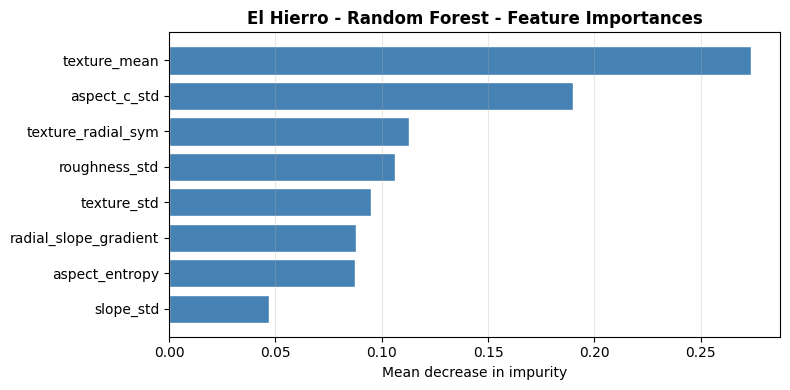

In [34]:
def plot_feature_importance(clf, feature_names, title_prefix=""):
    """Bar chart of mean decrease in impurity for each feature."""
    importances = clf.feature_importances_
    sorted_idx  = np.argsort(importances)

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.barh(
        [feature_names[i] for i in sorted_idx],
        importances[sorted_idx],
        color="steelblue", edgecolor="white"
    )
    ax.set_xlabel("Mean decrease in impurity")
    ax.set_title(f"{title_prefix} - Feature Importances", fontweight="bold")
    ax.grid(axis="x", alpha=0.3)
    plt.tight_layout()
    plt.show()


plot_feature_importance(clf_h, SELECTED_FEATURES,
                        title_prefix="El Hierro - Random Forest")

`texture_mean` dominates with an importance of ~0.28, nearly 50%
higher than the second feature. This confirms what the Cohen's d
analysis suggested: the average texture shading response inside the candidate disk is the single strongest discriminator between true cones and false positives. Geometrically, this makes sense: true scoria cones produce a consistent, bright circular bump in the texture shading rendering, while false positives from ridges and drainage channels generate a more irregular, lower-intensity
response.

`aspect_c_std` ranks second (~0.19), confirming its role as the
primary geometric discriminator: the circular dispersion of slope
orientation inside the disk captures the radial symmetry of a cone
in a way that no other single feature replicates.

The remaining six features (`texture_radial_sym`, `roughness_std`,
`texture_std`, `radial_slope_gradient`, `aspect_entropy`,
`slope_std`) contribute roughly equally in the 0.09-0.12 range.
None of them is dominant individually, but collectively they provide
the complementary geometric and physical signal that resolves the
cases where `texture_mean` and `aspect_c_std` alone are ambiguous.

`slope_std` ranks last (~0.05). It retains marginal utility: cones
have more regular flanks than scarps, but its Cohen's d of 0.397
was not fully converted into splitting power by the ensemble,
likely because its signal overlaps substantially with
`aspect_c_std` and `roughness_std`.

(Note: `radius_m` was removed from the feature set despite d>0.2 since it was not 'important' for the RF)

#### Operating Threshold Selection

For each candidate, the Random Forest outputs a probability between
0 and 1: its confidence that the candidate is a true scoria cone.
To produce a binary decision, a threshold is applied: candidates
above the threshold are classified as cones, those below are
rejected as false positives. **Precision** measures how many of
the predicted cones are actually true cones; **recall** measures
how many of the true cones were found.

The threshold is not fixed arbitrarily: it is selected by sweeping the final model across the range [0.20, 0.80] in steps of 0.02. At each step, all candidates with predicted probability above the threshold are compared against the ground truth and precision, recall, and F1 are computed explicitly against the 196 annotated cones.

The graph shows the characteristic trade-off:

- **Recall** (orange) starts near 0.96 at low thresholds: with
  a permissive threshold the classifier accepts almost everything
  and misses very few cones, but includes a large number of false
  positives.
- **Precision** (blue) grows as the threshold rises: the
  classifier becomes more selective, rejecting more candidates and
  keeping only those it is most confident about.
- **F1** (green) captures the balance between the two: it rises
  as precision improves, peaks at the optimal equilibrium point,
  then falls as the threshold becomes too conservative and recall
  collapses.

The optimal threshold is **0.64**, where F1 reaches its maximum

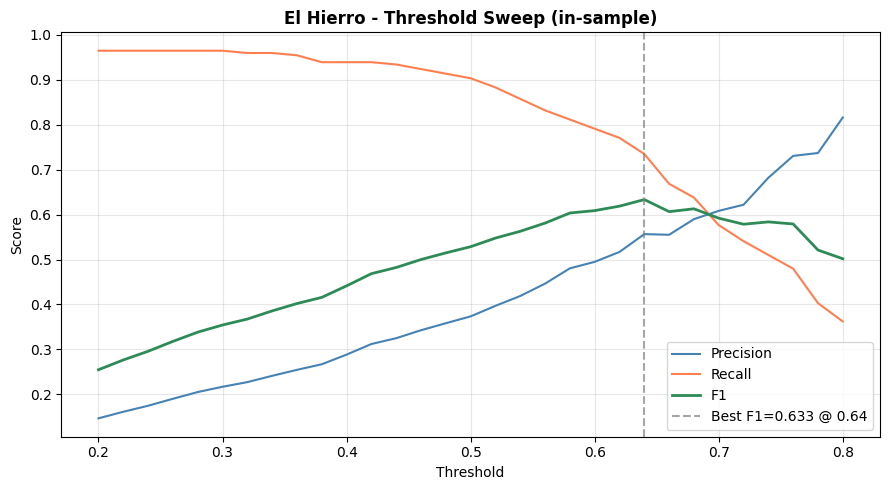

Best threshold : 0.64
  Precision    : 0.556
  Recall       : 0.735
  F1           : 0.633
  TP / FP / FN : 144 / 106 / 52


In [35]:
def threshold_sweep(clf, scaler, candidates, features, selected_features,
                    gt_df, tolerance_m, res_metres,
                    thresh_range=np.arange(0.20, 0.80, 0.02)):
    """
    Sweep the decision threshold on the final trained model.
    Computes precision, recall and F1 against ground truth at each step.
    Returns the F1-maximising threshold and the full results DataFrame.
    """
    probs   = clf.predict_proba(
        scaler.transform(features[selected_features].values)
    )[:, 1]
    results = []

    for t in thresh_range:
        detected = candidates[(probs >= t)].copy()
        m        = evaluate_detections(detected, gt_df, tolerance_m, res_metres)
        results.append({"threshold": t, **m})

    df   = pd.DataFrame(results)
    best = df.loc[df["f1"].idxmax()]

    fig, ax = plt.subplots(figsize=(9, 5))
    ax.plot(df["threshold"], df["precision"], label="Precision", color="steelblue")
    ax.plot(df["threshold"], df["recall"],    label="Recall",    color="coral")
    ax.plot(df["threshold"], df["f1"],        label="F1",        color="seagreen", lw=2)
    ax.axvline(best["threshold"], color="gray", linestyle="--", alpha=0.7,
               label=f"Best F1={best['f1']:.3f} @ {best['threshold']:.2f}")
    ax.set_xlabel("Threshold")
    ax.set_ylabel("Score")
    ax.set_title("El Hierro - Threshold Sweep (in-sample)", fontweight="bold")
    ax.legend()
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"Best threshold : {best['threshold']:.2f}")
    print(f"  Precision    : {best['precision']:.3f}")
    print(f"  Recall       : {best['recall']:.3f}")
    print(f"  F1           : {best['f1']:.3f}")
    print(f"  TP / FP / FN : {int(best['tp'])} / {int(best['fp'])} / {int(best['fn'])}")
    return float(best["threshold"]), df


best_thresh_h, sweep_df_h = threshold_sweep(
    clf_h, scaler_h, candidates_h, features_h,
    SELECTED_FEATURES, gt_h, 200, res_h[0]
)

```
Best threshold : 0.64
Precision    : 0.556
Recall       : 0.735
F1           : 0.633
TP / FP / FN : 144 / 106 / 52
```


At this operating point the classifier recovers 144 of the 196
annotated cones (recall 0.735) with 106 false positives remaining
(precision 0.556). Relative to the raw LoG detector, which
produced 3,460 candidates at precision 5.1%, the Random Forest
reduces the false positive count by a factor of ~30 while
retaining 76% of the detector recall.

The 52 missed cones represent the irreducible hard cases:
structures that are morphologically ambiguous in the 8-dimensional
feature space, either because they are heavily eroded, very small,
or embedded in terrain that produces similar feature signatures to
true cones. Lowering the threshold to recover them would reinstate
the false positives the classifier has learned to suppress:
a trade-off that no single threshold can resolve on terrain as
geologically complex as El Hierro.

This evaluation is in-sample: the final model has been retrained
on all 3,460 candidates and is evaluated on the same data. The
result is therefore optimistic relative to the cross-validation
estimate (mean F1 = 0.387). The true generalisation performance
lies between the two: the CV lower-bounds it, the sweep
upper-bounds it.

#### El Hierro - Final Detection Results

Predicted cones : 239  (threshold=0.64)

Random Forest - El Hierro (in-sample, optimised threshold)
  Detected   : 239
  TP         : 144
  FP         : 106
  FN         : 52
  Recall     : 0.735
  Precision  : 0.556
  F1         : 0.633


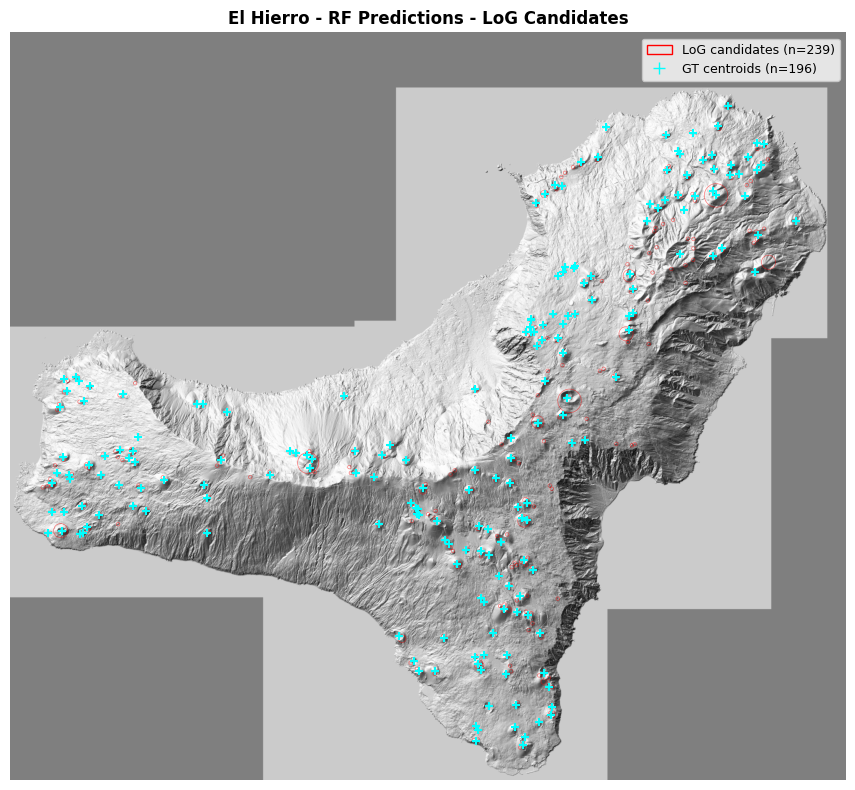

In [36]:
def predict_and_filter(clf, scaler, candidates, features,
                       selected_features, threshold, elongation_cutoff=None):
    """
    Apply the classifier at the chosen operating threshold.
    """
    X     = scaler.transform(features[selected_features].values)
    probs = clf.predict_proba(X)[:, 1]

    candidates               = candidates.copy()
    candidates["prob_cone"]  = probs
    candidates["label_pred"] = (probs >= threshold).astype(int)

    before = candidates["label_pred"].sum()
    if elongation_cutoff is not None and "elongation" in features.columns:
        candidates.loc[features["elongation"] > elongation_cutoff, "label_pred"] = 0
    after = candidates["label_pred"].sum()

    if elongation_cutoff is not None:
        print(f"After threshold ({threshold:.2f}) : {before}")
        print(f"After elongation filter   : {after}  (removed {before - after})")
    else:
        print(f"Predicted cones : {before}  (threshold={threshold:.2f})")

    return candidates[candidates["label_pred"] == 1].copy()


detected_h = predict_and_filter(
    clf_h, scaler_h, candidates_h, features_h,
    SELECTED_FEATURES, best_thresh_h
)

metrics_rf_h = evaluate_detections(detected_h, gt_h, 200, res_h[0])
print(f"\nRandom Forest - El Hierro (in-sample, optimised threshold)")
print(f"  Detected   : {len(detected_h)}")
print(f"  TP         : {metrics_rf_h['tp']}")
print(f"  FP         : {metrics_rf_h['fp']}")
print(f"  FN         : {metrics_rf_h['fn']}")
print(f"  Recall     : {metrics_rf_h['recall']:.3f}")
print(f"  Precision  : {metrics_rf_h['precision']:.3f}")
print(f"  F1         : {metrics_rf_h['f1']:.3f}")

plot_candidates_overlay(nw_h, detected_h, gt_df=gt_h,
                        title_prefix="El Hierro - RF Predictions")

```
Predicted cones : 239  (threshold = 0.64)
Detected   : 239
TP         : 144
FP         : 106
FN         : 52
Recall     : 0.735
Precision  : 0.556
F1         : 0.633
```

The classifier reduces the candidate pool from 3,460 (raw LoG) to
239 predicted cones: a reduction of ~93%, while retaining 144 of
the 196 annotated cones. Precision improves from 5.1% to 55.6%,
a factor of ~10, confirming that the Random Forest has learned to
suppress the dominant false positive classes (ridge flanks, drainage
channels, coastal scarps) that the LoG detector cannot distinguish
from true cones on geometric grounds alone.

These results are in-sample: the model was trained and evaluated on the same El Hierro candidate set. They should be interpreted as an upper bound on true performance, not as a generalisation estimate:
that role belongs to the cross-validation (mean F1 = 0.387) and to the qualitative Jeju transfer in Section 4.5.

The 52 missed cones (recall loss of 26.5% relative to the LoG
stage) represent the main limitation of the pipeline. Visually,
the overlay confirms this: most GT centroids are covered by a
predicted circle, but a non-negligible fraction, particularly in
the morphologically complex northern rift zone and the densely
packed cone fields of the western flank, are missed. These are
cones whose feature signatures overlap with the false positive
distribution, either due to heavy erosion, small size, or
proximity to structurally complex terrain. No threshold adjustment
can recover them without reinstating the false positives the
classifier has suppressed.

Despite this limitation, the result represents a substantial and
quantifiable improvement over both the raw LoG detector and the
knowledge-driven morphometric filter of Module 3, neither of which
could discriminate at the object level. The pipeline succeeds in
its primary goal: transforming a high-recall, low-precision
candidate pool into a compact, spatially coherent detection map
that a geologist could realistically use as a starting point for
manual validation.

### 4.5 - Zero-Shot Transfer to Jeju

The classifier trained on El Hierro is applied directly to the Jeju candidate set
without any retraining or parameter adjustment. This constitutes a **zero-shot
transfer** test: the model has never observed Jeju terrain, and no labelled data
from Jeju is available to evaluate it quantitatively.

The same operating threshold selected on El Hierro (0.64) is applied unchanged.
Evaluation is purely qualitative: the spatial distribution of detections is
compared against the known geology of Jeju Island, where approximately 360 monogenetic
volcanic cones (oreums) are distributed predominantly across the eastern plains,
with sparser coverage on the western shield and very few on the Hallasan massif itself.

Predicted cones : 60  (threshold=0.64)
Jeju - initial candidates : 3602
Jeju - predicted cones    : 60
Threshold applied         : 0.64  (unchanged from El Hierro)


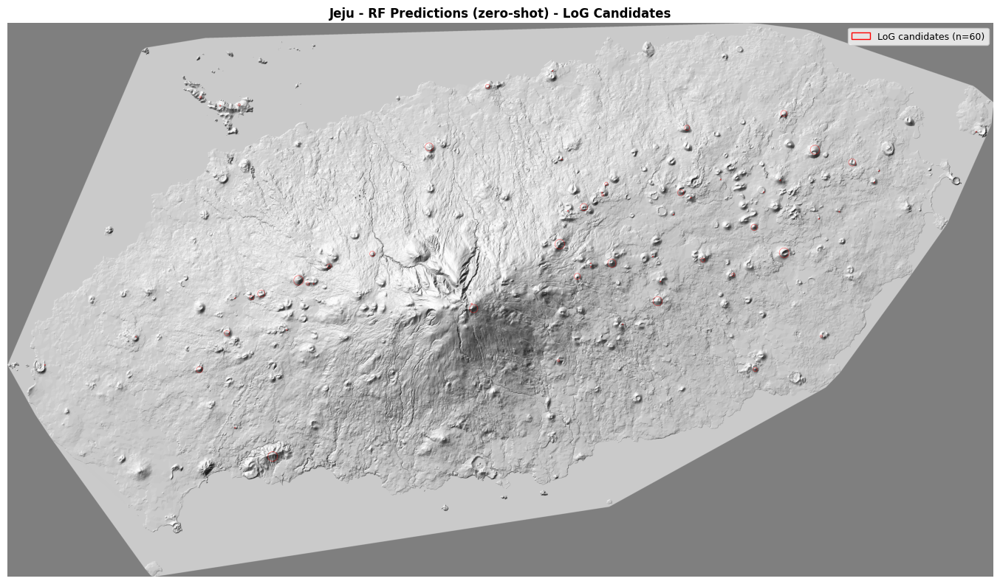

In [37]:
detected_j = predict_and_filter(
    clf_h, scaler_h, candidates_j, features_j,
    SELECTED_FEATURES, best_thresh_h
)

print(f"Jeju - initial candidates : {len(candidates_j)}")
print(f"Jeju - predicted cones    : {len(detected_j)}")
print(f"Threshold applied         : {best_thresh_h:.2f}  (unchanged from El Hierro)")

plot_candidates_overlay(nw_j, detected_j, gt_df=None,
                        title_prefix="Jeju - RF Predictions (zero-shot)")

```
Jeju - initial candidates : 3,602
Jeju - predicted cones    : 60
Threshold applied         : 0.64  (unchanged from El Hierro)
```

The classifier reduces 3,602 candidates to 60 predicted cones,
a reduction of 98.3%. Visually, the result is encouraging: the 60
detections are spatially distributed across the peripheral plains
and correspond to morphologically plausible, well-defined circular
structures. Crucially, the dense cluster of false positives that the
LoG detector generated around the Hallasan massif, drainage
channels, structural scarps, and erosional lineaments, has been
almost entirely suppressed. The classifier, trained to recognise
the physical signature of constructional cone morphology, correctly
rejects the radially asymmetric, rough terrain of the central
shield without ever having seen Jeju data.

However, 60 detections against a known population of 368 oreums (Literature)
implies a recall in the range of 15-20%: a substantial degradation
relative to the El Hierro in-sample performance (73.5%). This is
the expected and unavoidable cost of cross-domain transfer, and
it reveals the main limitation of the pipeline.

**Why does recall collapse on Jeju?** The classifier was trained
exclusively on El Hierro, a steep, erosionally complex oceanic
island where scoria cones are embedded in morphologically
heterogeneous terrain. The features it learned, particularly
`texture_mean` and `aspect_c_std`, were calibrated on that
specific morphological context. Jeju's oreums are structurally
simpler and rise from near-flat basaltic plains, producing feature
distributions that partially fall outside the El Hierro training
range. The model, uncertain about these out-of-distribution
candidates, assigns them probabilities below the 0.64 threshold
and rejects them as false positives.

This domain shift is not a failure of the methodology: it is a
fundamental challenge of any supervised detector applied across
geologically distinct volcanic settings. A model trained on one
island cannot be expected to fully generalise to another with
different resolution, erosion state, background morphology, and
cone size distribution. Addressing this limitation would require
either annotated Jeju data for fine-tuning, or a domain adaptation
strategy that explicitly bridges the feature distribution gap
between the two islands.

What the zero-shot result does demonstrate is that the learned
cone signature is not entirely island-specific: 60 geologically
plausible detections with minimal false positives on completely
unseen terrain confirms that the pipeline captures something real
about the physical character of scoria cones, even if it cannot
yet map them exhaustively across morphologically diverse volcanic
environments.

#### Directions for Improvement

The zero-shot transfer result points to several concrete directions
that could substantially improve generalisation across volcanic
settings.

**More training data.** The most direct fix is the most obvious
one: training on a single island with 196 annotated cones is a
severe constraint. A multi-island training set, combining El
Hierro with annotated data from Jeju, Etna, the Canary Islands,
or other well-mapped volcanic fields, would expose the classifier
to a much wider range of morphological contexts and reduce its
dependence on El Hierro-specific feature distributions. Even a
handful of annotated Jeju oreums used for fine-tuning would likely recover a large fraction of the missed detections.

**Domain adaptation.** Rather than collecting new annotations,
domain adaptation techniques could bridge the feature distribution
gap between source (El Hierro) and target (Jeju) without requiring
target labels. Methods such as feature normalisation across domains,
or instance reweighting that up-samples El Hierro candidates whose
features resemble the Jeju distribution, could improve transfer
without additional annotation effort.

**Deep learning on DEMs.** The entire hand-crafted feature
engineering pipeline: slope, roughness, aspect, zonal statistics, could be replaced by a convolutional neural network trained
directly on DEM patches or rendering composites. A CNN would learn
its own spatial features from data, potentially capturing cone
signatures that are difficult to express as scalar statistics.
Models such as U-Net, trained on georeferenced raster patches with
pixel-level or object-level annotations, have shown strong
performance on analogous remote sensing detection tasks and would
be a natural next step for this problem.

**Resolution-aware detection.** The current pipeline applies LoG
detection on a uniformly downsampled version of the texture shading
(factor 2x), trading spatial resolution for computational speed.
Very small cones near the minimum detectable radius (60 m) may
produce a weaker response at the reduced resolution. Running a
complementary detection pass at the original resolution, restricted
to the small-sigma range, could recover morphologically marginal
structures that the downsampled pipeline misses.

**Richer input channels.** The pipeline currently uses only DEM
derivatives and hillshade renderings. Incorporating additional
remote sensing data: multispectral imagery, SAR backscatter, or
vegetation index maps, would provide complementary information
about surface composition and land cover that could help
distinguish constructional volcanic morphology from erosional
or structural landforms that share similar topographic signatures.